<a href="https://colab.research.google.com/github/Mr-Shubham-Patel/Bike-Sharing-Demand-Prediction-/blob/main/Bike_Sharing_Demand_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Bike Sharing Demand Prediction**



##### **Project Type**    - Regression
##### **Contribution**    - Team
##### **Team Member 1 -** Patel Shubham
##### **Team Member 2 -** Patel Jay


# **Project Summary -**

The bike sharing demand prediction project involved developing a machine learning model to accurately predict the demand for bike sharing based on various features such as temperature, hour of the day, humidity, functioning day, season, and others. The goal was to create a model that can help bike sharing companies optimize their operations, improve resource allocation, and enhance user experience.

The following steps were performed in the project:

*   **Data Collection**: Relevant data, including historical bike sharing demand data and related features, were collected from reliable sources such as public datasets, APIs, or company records.
*   **Data Preprocessing**: The collected data was preprocessed to handle missing values, outliers, and inconsistencies. Features were also transformed or encoded as needed to prepare them for machine learning modeling.

* **Exploratory Data Analysis (EDA)**: EDA was performed to gain insights into the data, understand the relationships between different features, and identify any patterns or trends that could impact bike sharing demand.
*  **Feature Engineering**: New features were created or existing features were transformed to extract relevant information and improve the predictive power of the model. This could include feature scaling, one-hot encoding, feature selection, or extraction of temporal features.

*  **Model Selection**: Different machine learning algorithms, such as Linear regression , decision tree , Random Forest, Gradient Boosting were evaluated and compared based on their performance metrics such as accuracy, RMSE, R2 score, and others.
*   **Model Training**: The selected model was trained on the preprocessed data using appropriate training techniques such as cross-validation or time-series split to prevent overfitting and ensure robustness.

*   **Model Evaluation**: The trained model was evaluated using various evaluation metrics such as RMSE, R2 score, and others to assess its performance and generalization capability on unseen data.

The ultimate goal was to improve bike sharing operations and achieve a positive business impact.









# **GitHub Link -**

https://github.com/Mr-Shubham-Patel/Bike-Sharing-Demand-Prediction-.git

# **Problem Statement**


**With the introduction of rental bikes in many urban cities, the need to ensure the availability and accessibility of rental bikes to the public at the right time has become a critical concern. Efficient management of the rental bike fleet is essential to minimize waiting times for users and ensure a stable supply of bikes. The key problem statement is to develop a machine learning model that can accurately predict the demand for rental bikes at each hour, allowing for effective planning and allocation of bikes to meet the demand.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.linear_model import Ridge, LinearRegression, Lasso, ElasticNet
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import StackingRegressor

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

### Dataset Loading

In [ ]:
# Load Dataset
Data=('https://github.com/Mr-Shubham-Patel/Bike-Sharing-Demand-Prediction-/raw/main/SeoulBikeData.csv')

In [ ]:
Data_bsdp= pd.read_csv(Data,encoding='ISO-8859-1')

### Dataset First View

In [ ]:
# Dataset First Look
Data_bsdp

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
Rows = Data_bsdp.shape[0]
Columns=Data_bsdp.shape[1]
print(f"The number of rows is {Rows} and number of columns is {Columns}")

The number of rows is 8760 and number of columns is 14


### Dataset Information

In [ ]:
# Dataset Info
Data_bsdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
duplicates =len(Data_bsdp[Data_bsdp.duplicated()])
print(duplicates)

0




*   There is no duplicate value.




#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
Data_bsdp.isna().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64



*   As we can see there are no null values present in our dataset.




### What did you know about your dataset?



*   In our dataset there is 8760 raws and 14 columns. 
*   in Dataset info **Date,Seasons,Functioning day** and **Holiday** are object type and other are numeric type.

*   there is no duplicatte and null or missing value in our dataset.






## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
print(list(Data_bsdp.columns))

['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day']


In [ ]:
# Dataset Describe
Data_bsdp.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,8760,365,01/12/2017,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rented Bike Count,8760.0,NaN,NaN,NaN,704.602055,644.997468,0.0,191.0,504.5,1065.25,3556.0
Hour,8760.0,NaN,NaN,NaN,11.5,6.922582,0.0,5.75,11.5,17.25,23.0
Temperature(°C),8760.0,NaN,NaN,NaN,12.882922,11.944825,-17.8,3.5,13.7,22.5,39.4
Humidity(%),8760.0,NaN,NaN,NaN,58.226256,20.362413,0.0,42.0,57.0,74.0,98.0
Wind speed (m/s),8760.0,NaN,NaN,NaN,1.724909,1.0363,0.0,0.9,1.5,2.3,7.4
Visibility (10m),8760.0,NaN,NaN,NaN,1436.825799,608.298712,27.0,940.0,1698.0,2000.0,2000.0
Dew point temperature(°C),8760.0,NaN,NaN,NaN,4.073813,13.060369,-30.6,-4.7,5.1,14.8,27.2
Solar Radiation (MJ/m2),8760.0,NaN,NaN,NaN,0.569111,0.868746,0.0,0.0,0.01,0.93,3.52
Rainfall(mm),8760.0,NaN,NaN,NaN,0.148687,1.128193,0.0,0.0,0.0,0.0,35.0


### Variables Description 




* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity(%) - Humidity is a measure of the amount of moisture or water vapor in the air.
* ### Windspeed (m/s)-Windspeed refers to the speed or velocity of the wind.
* ### Visibility(10m)- Visibility is the distance at which objects can be clearly seen in the atmosphere.
* ### Dew point temperature(Celsius)-Dew point temperature is the temperature at which air becomes saturated with moisture and condenses into dew or frost.
* ### Solar radiation(MJ/m2)-Solar radiation is the amount of energy received from the Sun per unit area of the Earth's surface. 
* ### Rainfall (mm) -Rainfall is the amount of precipitation in the form of liquid water that falls from the atmosphere to the Earth's surface.
* ### Snowfall (cm)- Snowfall is the amount of precipitation in the form of frozen water that falls from the atmosphere to the Earth's surface.
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)




### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
Data_bsdp.nunique()

Date                          365
Rented Bike Count            2166
Hour                           24
Temperature(°C)               546
Humidity(%)                    90
Wind speed (m/s)               65
Visibility (10m)             1789
Dew point temperature(°C)     556
Solar Radiation (MJ/m2)       345
Rainfall(mm)                   61
Snowfall (cm)                  51
Seasons                         4
Holiday                         2
Functioning Day                 2
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

**convert the "date" column into 3 different columns i.e "year","month","day"**

In [ ]:
import datetime as dt
Data_bsdp['Date'] = Data_bsdp['Date'].apply(lambda x: dt.datetime.strptime(x,"%d/%m/%Y"))

In [ ]:
Data_bsdp['year'] = Data_bsdp['Date'].dt.year
Data_bsdp['month'] = Data_bsdp['Date'].dt.month

Data_bsdp['day'] = Data_bsdp['Date'].dt.day_name()

In [ ]:
#creating a new column of "weekdays_weekend" and drop the column "Date","day","year"
Data_bsdp['week']=Data_bsdp['day'].apply(lambda x : "weekend" if x=='Saturday' or x=='Sunday' else "weekday")

In [ ]:
# checking no of years
Data_bsdp['week'].value_counts()

weekday    6264
weekend    2496
Name: week, dtype: int64

In [ ]:
#drop unwanted column
Data_bsdp=Data_bsdp.drop(columns=['Date','day','year'],axis=1)

In [ ]:
Data_bsdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   int64

### <b>Removing Multicollinearity:</b>
Multicollinearity is check when two independent variables are highly correlated to each other.



I will check the multicollinearity of our dataset by using the variance inflation factor. Accepted VIF will be less than 10.

In [ ]:
#Creating a function to calculate the variance inflation factor(VIF)
def data_vif(X):
    vif = pd.DataFrame()
    vif["Columns"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [ ]:
#Calculating the VIF for independent columns
data_vif(Data_bsdp[[i for i in Data_bsdp.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,Columns,VIF
0,Hour,3.952873
1,Temperature(°C),3.285991
2,Humidity(%),6.034847
3,Wind speed (m/s),4.651738
4,Visibility (10m),5.339713
5,Solar Radiation (MJ/m2),2.253453
6,Rainfall(mm),1.079756
7,Snowfall (cm),1.130941
8,month,5.002899


### What all manipulations have you done and insights you found?



*   We convert Date into the Datetime and drop unwanted column.
*   then we have check for Multicollinearity using variance inflation factor(VIF).



## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

[Text(0.5, 1.0, 'Rented bike each month count')]

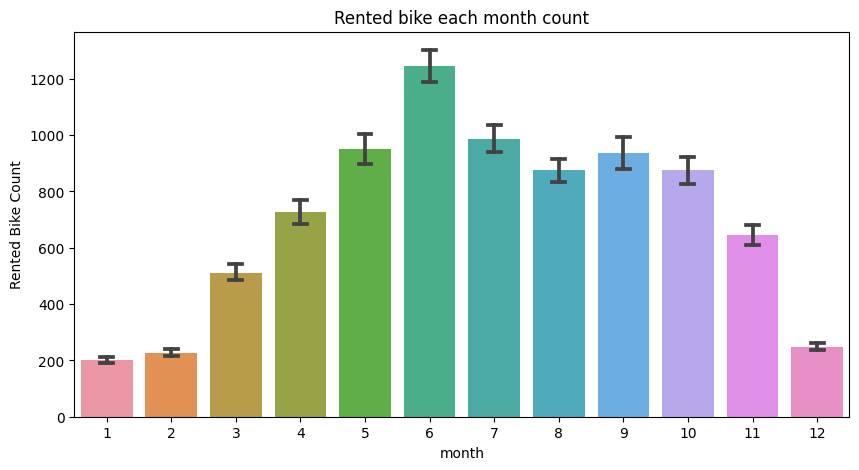

In [ ]:
#Bar chart for the analysis of bike demand in month
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=Data_bsdp,x='month',y='Rented Bike Count',ax=ax,capsize=.2)
ax.set(title='Rented bike each month count')

##### 1. Why did you pick the specific chart?



*   The specific chart chosen is a bar chart, specifically a vertical bar chart, to analyze the bike demand in different months. This type of chart is suitable for comparing categorical data (months in this case) with numerical data (rented bike count) and provides a clear visual representation of the differences between the months.




##### 2. What is/are the insight(s) found from the chart?

 

*   The insights gained from the chart can include identifying the months **6 , 7 , 5 , 9** with the  highest and  **1 ,2,12** lowest bike demand.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights can potentially help create a positive business impact by allowing the bike sharing service provider to make informed decisions related to operations and resource allocation.
*   if the chart shows that bike demand is consistently high during certain months, the provider can plan for increased bike availability, adjust pricing or promotions accordingly, and ensure efficient maintenance and service during peak demand periods.

*    On the other hand, if the chart reveals negative growth or low demand in certain months, the provider may need to focus on marketing and promotional efforts, offer discounts or incentives, or explore other strategies to boost demand during those periods.
*    any negative growth would require a detailed analysis of the underlying reasons, such as weather conditions, holidays, or events that may have affected bike demand negatively during certain months.





#### Chart - 2

[Text(0.5, 1.0, 'Count of Rented bikes acording to weekend and weekenday')]

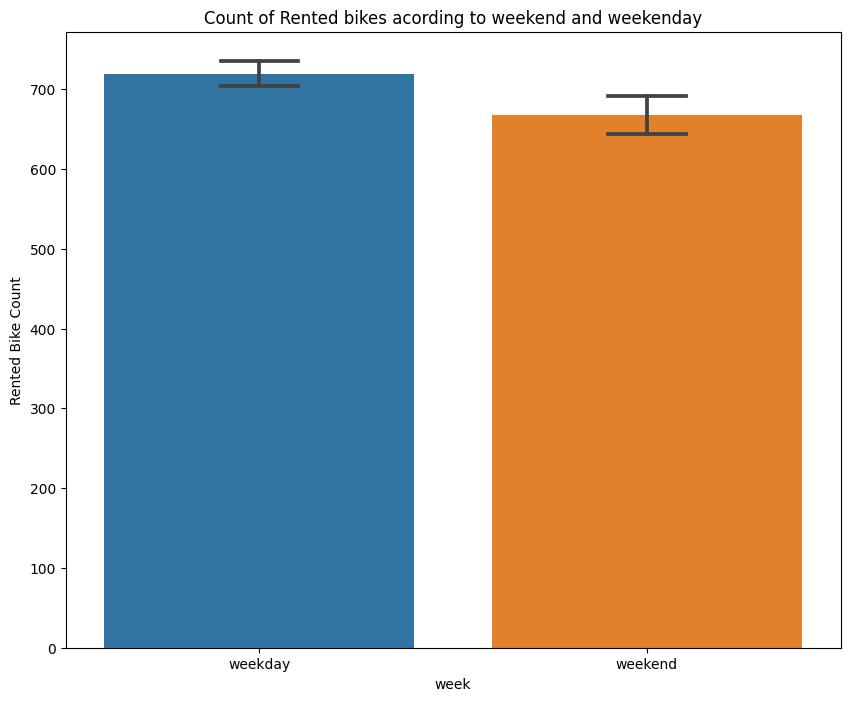

In [ ]:
#Bar chart for the analysis of bike demand in weekday or  weekend

fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(data=Data_bsdp,x='week',y='Rented Bike Count',ax=ax,capsize=.2)
ax.set(title='Count of Rented bikes acording to weekend and weekenday')

[Text(0.5, 1.0, 'Count of Rented bikes acording to weekend and weekenday ')]

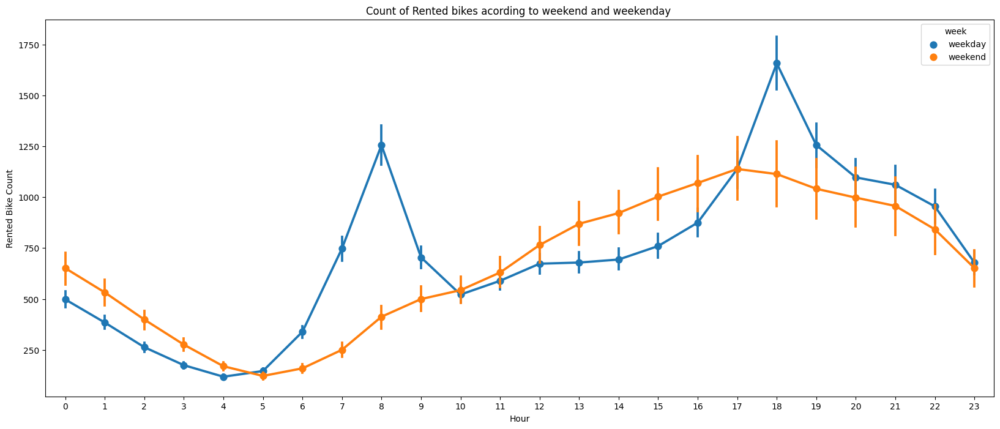

In [ ]:
# Point plot for the analysis of bike demand hourly base 
fig,ax=plt.subplots(figsize=(20,8))
sns.pointplot(data=Data_bsdp,x='Hour',y='Rented Bike Count',hue='week',ax=ax)
ax.set(title='Count of Rented bikes acording to weekend and weekenday ')

##### 1. Why did you pick the specific chart?



*   The specific charts chosen are a bar chart and a point plot. The bar chart is used to analyze the bike demand on weekdays and weekends, while the point plot is used to analyze the bike demand on an hourly basis, with separate plots for weekdays and weekends.




##### 2. What is/are the insight(s) found from the chart?



*   In the week days the demand of the bike is higher because of the running days as compare to the weekend.
*   Based on the point plot , we can infer that the demand for rented bikes is higher on weekdays, indicated by the blue color. This can be attributed to the demand from office-goers during peak hours of 7 am to 9 am and 5 pm to 7 pm.

*   On the other hand, the demand for rented bikes is comparatively lower on weekends, as shown by the orange color. Specifically, the demand is low in the morning hours but slightly increases in the evening hours from 4 pm to 8 pm.






##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insights that the demand for rented bikes is higher on weekdays and lower on weekends can potentially help create a positive business impact for a bike sharing service provider. Here are some reasons:

*   Resource allocation  ,Pricing and promotions ,Operational planning

However, it's important to note that the gained insights may also lead to negative growth if not properly addressed.

*  Potential loss of revenue on weekends ,Customer dissatisfaction ,Operational challenges






#### Chart - 3

[Text(0.5, 1.0, 'Count of Rented bikes acording to Functioning Day ')]

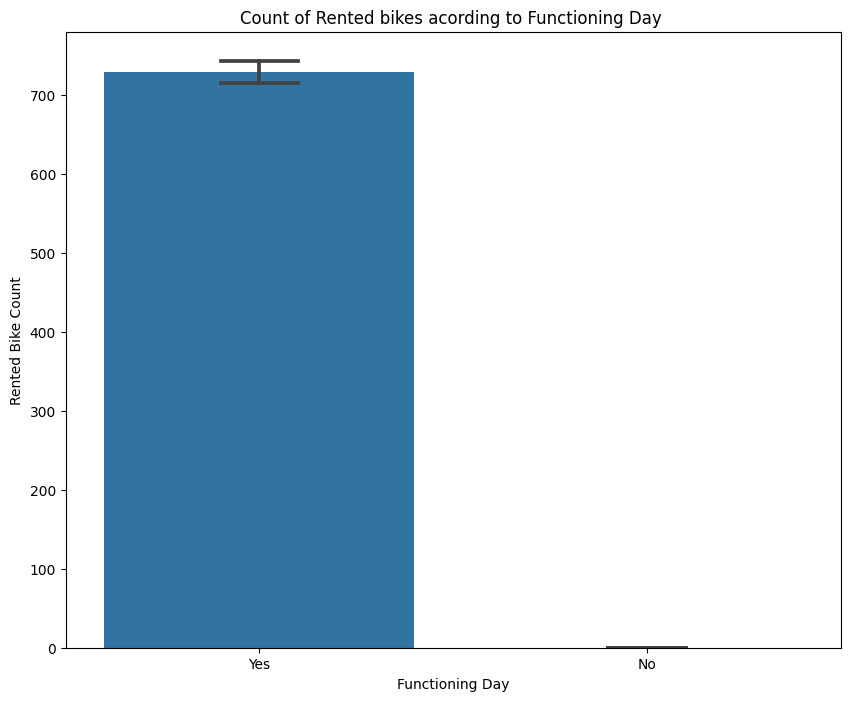

In [ ]:
#Bar chart for the analysis of bike demand in functional day
fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(data=Data_bsdp,x='Functioning Day',y='Rented Bike Count',ax=ax,capsize=.2)
ax.set(title='Count of Rented bikes acording to Functioning Day ')

[Text(0.5, 1.0, 'Count of Rented bikes acording to Functioning Day ')]

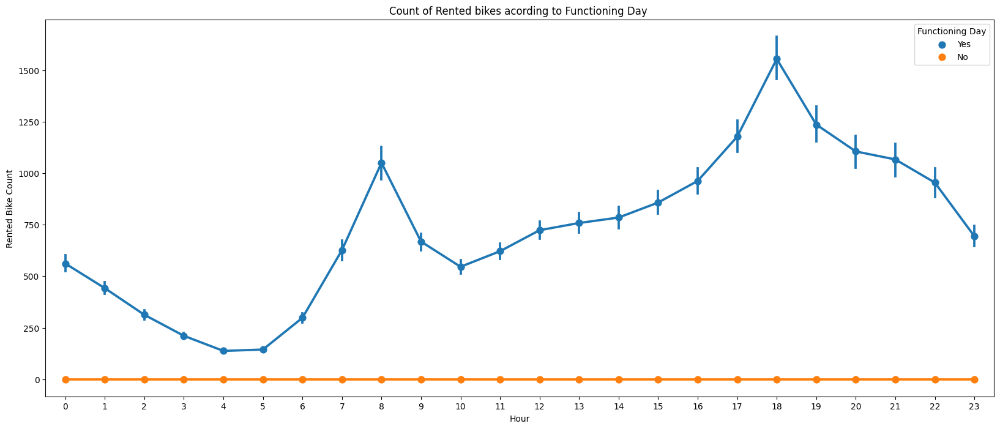

In [ ]:
fig,ax=plt.subplots(figsize=(20,8))
sns.pointplot(data=Data_bsdp,x='Hour',y='Rented Bike Count',hue='Functioning Day',ax=ax)
ax.set(title='Count of Rented bikes acording to Functioning Day ')

##### 1. Why did you pick the specific chart?



*   The bar chart and point plot were chosen to analyze the bike demand based on the functioning day (functional or non-functional day). The bar chart provides a visual representation of the count of rented bikes on functional and non-functional days, while the point plot shows the count of rented bikes by hour, differentiating between functional and non-functional days using hue.




##### 2. What is/are the insight(s) found from the chart?




* In the above bar plot and point plot which shows the use of rented bike in functioning day or not.

  It's clearly shows that,Peoples dont use reneted bikes in no functional day.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*    it's important for the bike sharing service provider to carefully analyze the insights gained and take appropriate actions, such as adjusting resources, pricing, promotions, and operational planning, to address any potential negative impacts and capitalize on the positive impacts to ensure sustainable business growth.




#### Chart - 4

In [ ]:
#Creating a function that performs a groupby operation and returns a dataframe for analysis
def Data_bsdp_analysis(col):
  return Data_bsdp.groupby(col)['Rented Bike Count'].sum().reset_index()

In [ ]:
#Seasons column
seasons_cs = Data_bsdp_analysis('Seasons')
seasons_cs

,Seasons,Rented Bike Count
0,Autumn,1790002
1,Spring,1611909
2,Summer,2283234
3,Winter,487169


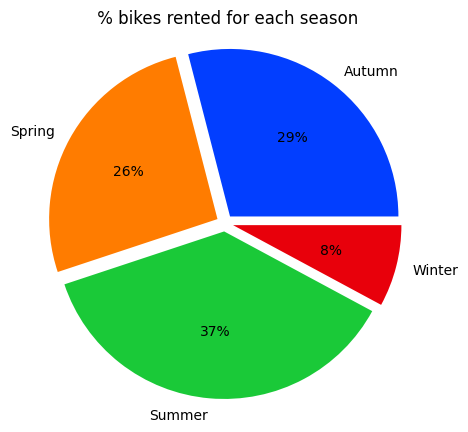

In [ ]:
#Initial preparations for plotting pie chart with percentages
seasons_list = list(seasons_cs['Seasons']) 
rented_count_list = list(seasons_cs['Rented Bike Count'])
palette_color = sns.color_palette('bright')
explode = (0.05,0.05,0.05,0.05)

#Creating the pie chart visualisation for seasons column
plt.figure(figsize=(5,5))
plt.pie(rented_count_list,labels=seasons_list,colors=palette_color,explode=explode,autopct='%0.0f%%')
plt.title(" % bikes rented for each season")
plt.axis("equal")  
plt.show()

##### 1. Why did you pick the specific chart?



*   The pie chart was chosen to visualize the percentage distribution of total number of bikes rented for each season. It is a commonly used chart for displaying relative proportions or percentages in a visually appealing way. The use of different colors and exploded segments can make it easier to interpret the data and identify patterns or trends.




##### 2. What is/are the insight(s) found from the chart?



*   From the upper pie chart you can see summer,Autumn and spring have a most percentage of Rented bikes. and Winter has a less. 




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   As you can see positive bussiness impact on summer, Autumn and spring seasons.
*    it's also important to consider potential negative impacts, such as reduced demand during Winter season, which may require additional planning and strategies to mitigate the lower demand, such as offering promotions or diversifying services to attract customers during the off-peak season.



#### Chart - 5

In [ ]:
#anlysis of data by vizualisation
holidays_cs=Data_bsdp_analysis('Holiday')
holidays_cs

,Holiday,Rented Bike Count
0,Holiday,215895
1,No Holiday,5956419


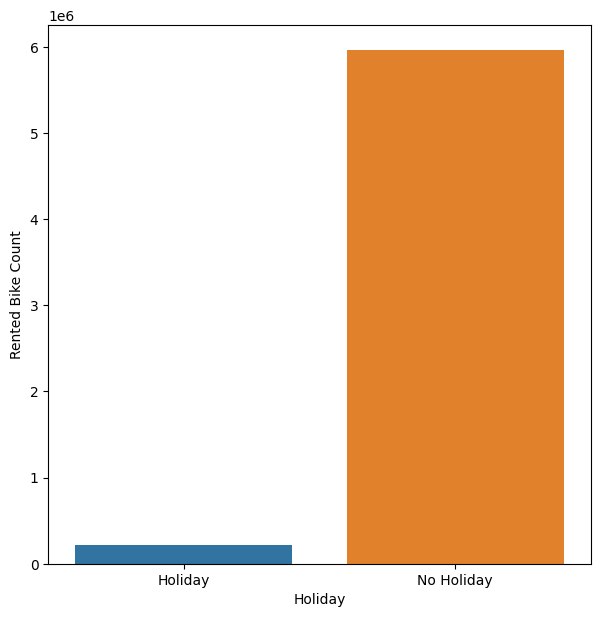

In [ ]:
plt.figure(figsize=(7,7))
sns.barplot(data=holidays_cs,x='Holiday',y='Rented Bike Count')
plt.show()

[Text(0.5, 1.0, 'Rented bikes count on Holiday ')]

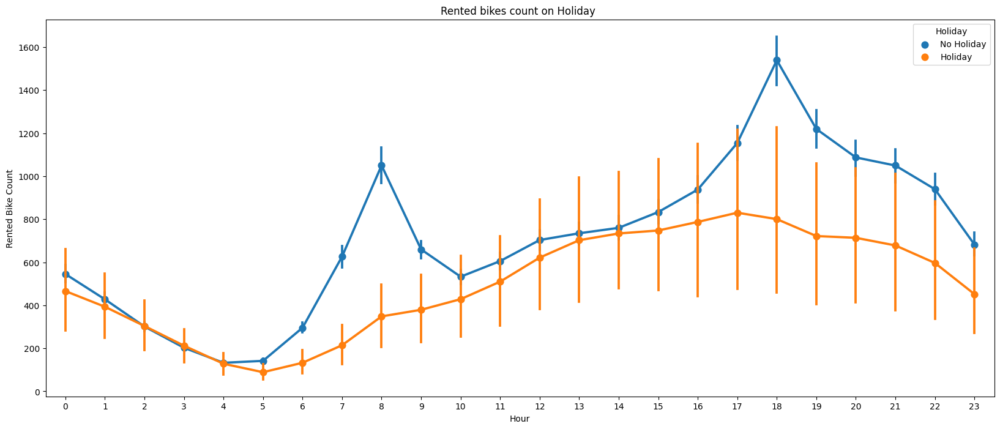

In [ ]:
fig,ax=plt.subplots(figsize=(20,8))
sns.pointplot(data=Data_bsdp,x='Hour',y='Rented Bike Count',hue='Holiday',ax=ax)
ax.set(title='Rented bikes count on Holiday ')

##### 1. Why did you pick the specific chart?



*   The bar chart and point plot were chosen to visualize the rented bike count during holidays. The bar chart displays the total rented bike count for each holiday, while the point plot shows the rented bike count during different hours of the day, with different points representing holidays and non-holidays. 




##### 2. What is/are the insight(s) found from the chart?



*   As we can see that the majority of the bikes rented are on days which are considered as No Holiday.
*   On Holiday peak hour for rented bike are 7 to 9 AM and 5 to 7 PM.



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   From gain insights we can tell , there are positive bussiness impact on NO holidays. 


*   it's also important to consider potential negative impacts, such as reduced demand during holidays or during off-peak hours. 






#### Chart - 6

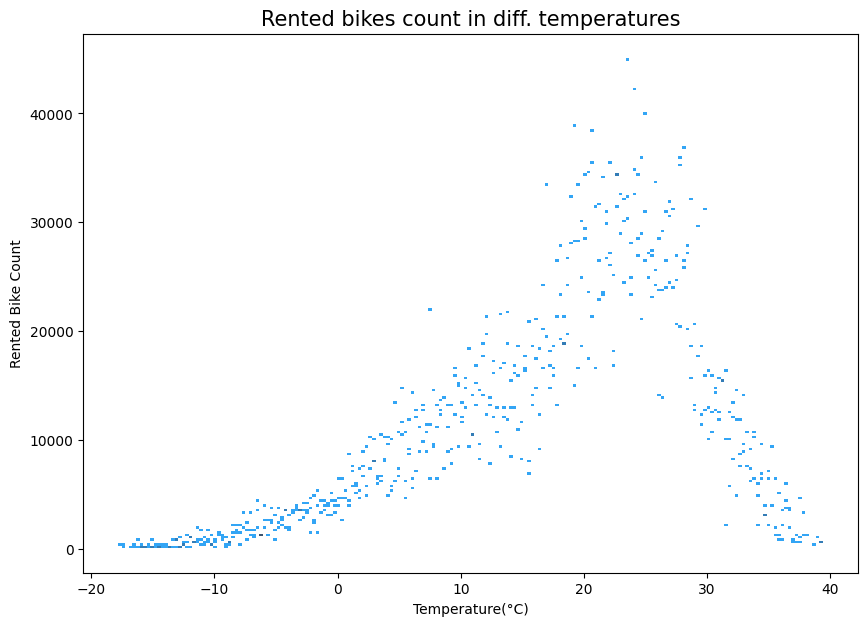

In [ ]:
#Creating a visualisation to analyse the number of bikes rented for different temperatures
temp_ = Data_bsdp_analysis('Temperature(°C)')

#Creating a visualisation for different temperatures
plt.figure(figsize=(10,7))
sns.histplot(data=temp_,x='Temperature(°C)',y='Rented Bike Count',bins=200)
plt.title('Rented bikes count in diff. temperatures',size=15)
plt.show()

##### 1. Why did you pick the specific chart?



*   The histogram plot is suitable for analyzing the distribution of rented bike counts across different temperature ranges, which can help identify patterns or trends in bike rentals based on temperature variations.




##### 2. What is/are the insight(s) found from the chart?



*   The insight gained from the chart is that the most number of bikes are rented in the temperature range of 15 degrees to 30 degrees Celsius. 




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights can potentially help create a positive business impact by allowing the bike sharing service provider to optimize their operations and marketing strategies based on temperature variations.




#### Chart - 7

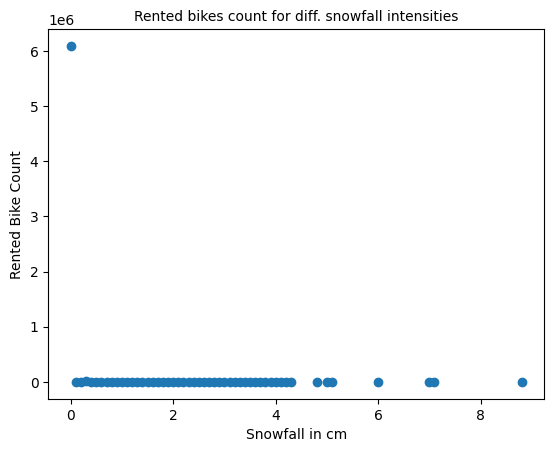

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different intensities of snowfall
snowfall = Data_bsdp_analysis('Snowfall (cm)')

#Creating a visualisation for different snowfall intensities
plt.scatter(data=snowfall,x='Snowfall (cm)',y='Rented Bike Count')
plt.title('Rented bikes count for diff. snowfall intensities',size=10)
plt.xlabel('Snowfall in cm')
plt.ylabel('Rented Bike Count')
plt.show()

##### 1. Why did you pick the specific chart?



*   The specific chart chosen in this case is a scatter plot, which is used to visualize the relationship between two continuous variables (snowfall intensity and rented bike count) in this case.

*   The scatter plot is suitable for analyzing how the rented bike count varies with different intensities of snowfall, allowing for the identification of any potential patterns or trends.







##### 2. What is/are the insight(s) found from the chart?



*   As you can see there are most number of rented bikes are in 0 cm snowfall.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights can potentially help create a positive business impact by providing information on how snowfall intensity may affect bike rentals. This information can be used to optimize operations and marketing strategies during snowy weather conditions. 
*  it is essential to consider other factors such as local weather patterns, customer preferences, and safety considerations to make informed decisions and mitigate any potential negative impacts.


#### Chart - 8

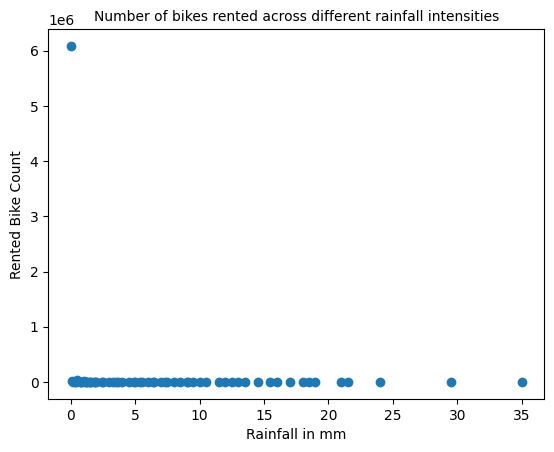

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different intensities of rainfall
rainfall = Data_bsdp_analysis('Rainfall(mm)')
rainfall.head()

#Creating a visualisation for different rainfall intensities
plt.scatter(data=rainfall,x='Rainfall(mm)',y='Rented Bike Count')
plt.title('Number of bikes rented across different rainfall intensities',size=10)
plt.xlabel('Rainfall in mm')
plt.ylabel('Rented Bike Count')
plt.show()

##### 1. Why did you pick the specific chart?



*   The specific chart chosen in this case is a scatter plot, which is used to visualize the relationship between two continuous variables (Rainfall intensity and rented bike count) in this case.

*   The scatter plot is suitable for analyzing how the rented bike count varies with different intensities of Rainfall, allowing for the identification of any potential patterns or trends.




##### 2. What is/are the insight(s) found from the chart?



*   As you can see there are most number of rented bikes are in 0 mm Rainfall.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*     The gained insights can potentially help create a positive business impact by providing information on how Rainfall intensity may affect bike rentals. This information can be used to optimize operations and marketing strategies during Rainy weather conditions. 
*  it is essential to consider other factors such as local weather patterns, customer preferences, and safety considerations to make informed decisions and mitigate any potential negative impacts.





#### Chart - 9

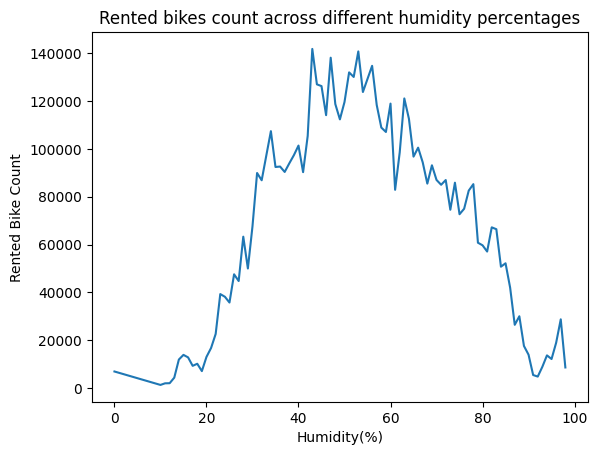

In [ ]:
#Creating a dataframe for analysing the number of bikes rented for different humidity percentages. 
humidity_bike = Data_bsdp_analysis('Humidity(%)')

#Plotting a visualisation for the different humidity percentages
plt.plot(humidity_bike['Humidity(%)'],humidity_bike['Rented Bike Count'])
plt.xlabel('Humidity(%)')
plt.ylabel("Rented Bike Count")
plt.title("Rented bikes count across different humidity percentages")
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.



*  The line plot is suitable for analyzing how the rented bike count varies with different humidity percentages and identifying any potential trends or patterns.




##### 2. What is/are the insight(s) found from the chart?



*   From the line plot we can see most number of rented bikes in between 25% to 80% humidity.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights can potentially help create a positive business impact by providing information on how humidity percentage may affect bike rentals. 
*   This information can be used to optimize operations and marketing strategies during different humidity conditions. For example, the bike sharing service provider can plan for appropriate inventory management, maintenance, and marketing efforts during high humidity periods.



#### Chart - 10

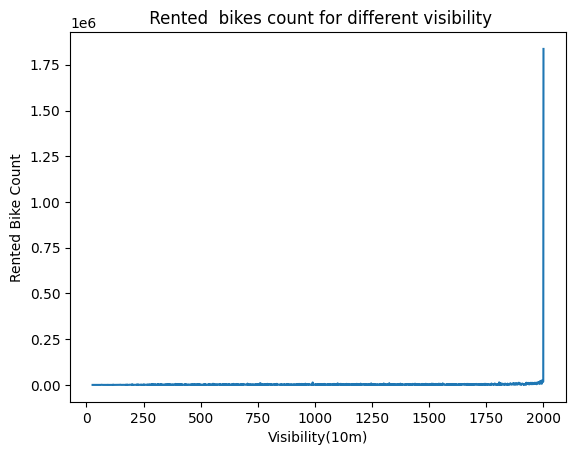

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different visibility rates
visibility = Data_bsdp_analysis('Visibility (10m)')

#Creating a visualisation for number of bikes rented in different visibility ranges
plt.plot(visibility['Visibility (10m)'],visibility['Rented Bike Count'])
plt.xlabel('Visibility(10m)')
plt.ylabel('Rented Bike Count')
plt.title(' Rented  bikes count for different visibility')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen in this case is a line plot, which is used to display the trend or pattern of a single continuous variable (visibility in meters) against another continuous variable (rented bike count). The line plot is suitable for analyzing how the rented bike count varies with different visibility ranges and identifying any potential trends or patterns.



##### 2. What is/are the insight(s) found from the chart?



*   the insight found is that higher visibility is preferred by customers, as there is an increase in rented bike count with increasing visibility.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   the impact of visibility on bike rentals may also be influenced by other factors such as weather conditions, time of day, and customer preferences. It is important to consider these factors and conduct further analysis to make informed decisions and ensure that the insights gained from the chart are appropriately applied to create a positive business impact.



#### Chart - 11

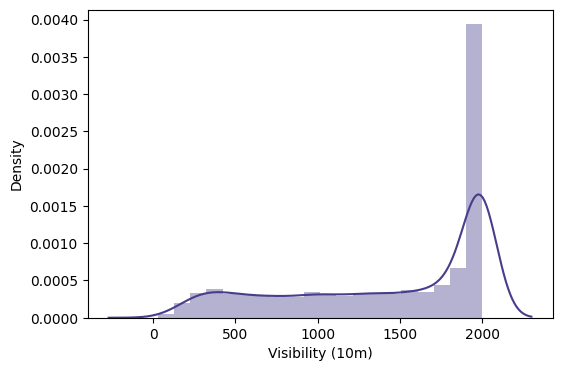

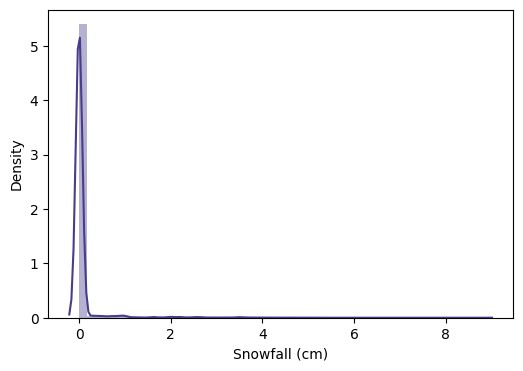

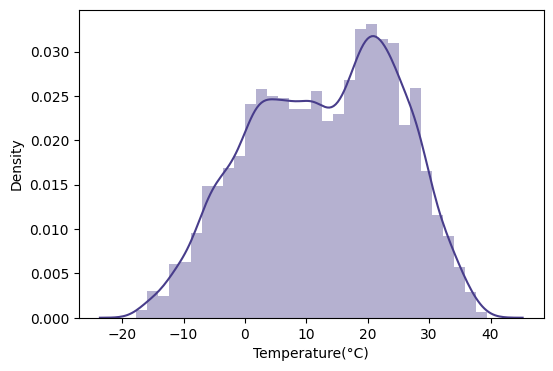

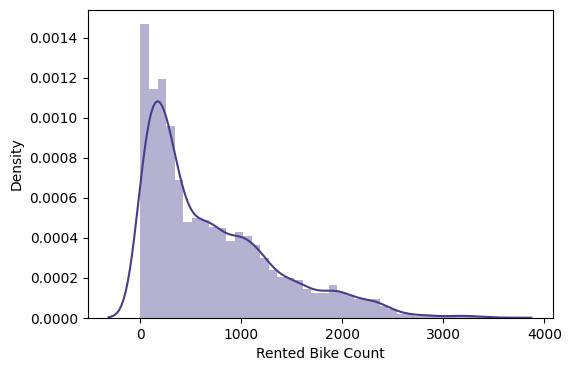

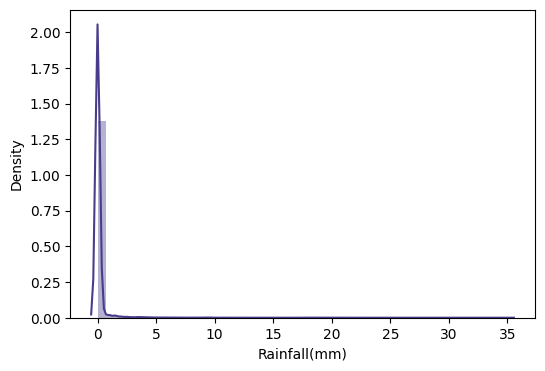

...

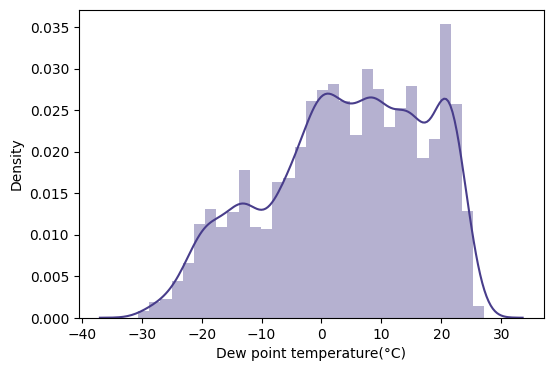

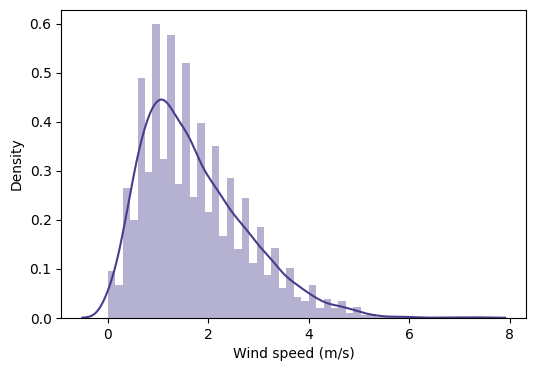

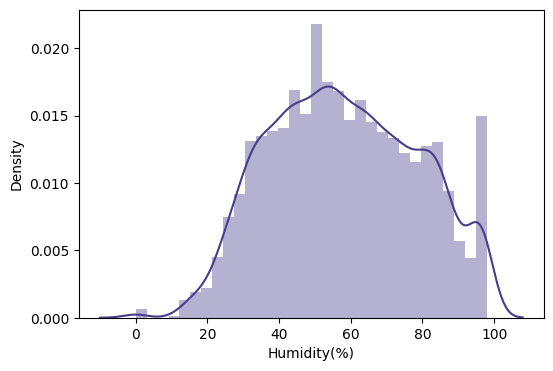

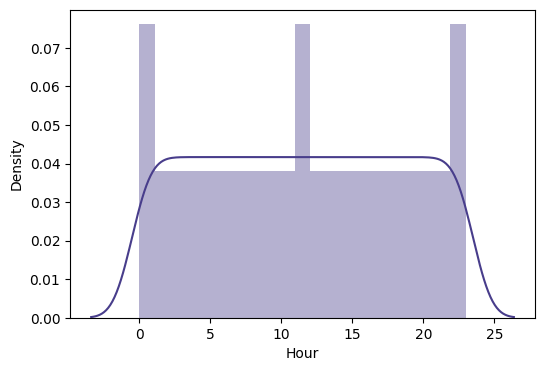

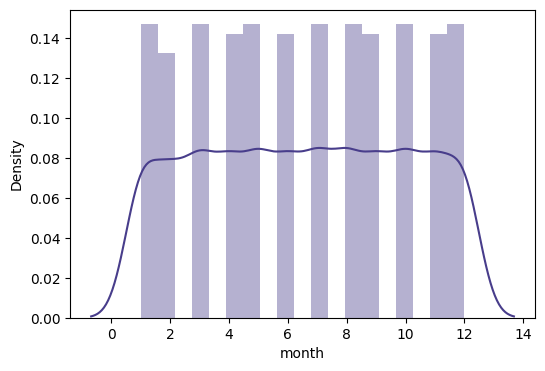

In [ ]:
#assigning numerical coulmn to variable
column_list= list(set(Data_bsdp.describe()))

#plotting distplots to analyze the distribution of all numerical features
for col in column_list:
  plt.figure(figsize=(6,4))
  sns.distplot(x=Data_bsdp[col],color= 'darkslateblue', kde = True)
  plt.xlabel(col)
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen in this case is a distribution plot (distplot) using seaborn library, which is used to display the distribution of a single continuous variable. The distplot provides a visual representation of the frequency distribution and shape of the data, allowing for analysis of the distribution of each numerical feature in the dataset.


##### 2. What is/are the insight(s) found from the chart?





*  From the distribution plots, it can be observed that some of the distributions are right-skewed, while some are left-skewed. Skewness refers to the asymmetry of the data distribution, with positive skewness indicating a longer tail on the right side and negative skewness indicating a longer tail on the left side. 



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights from the distribution plots can potentially help create a positive business impact by providing information on the distribution and shape of the numerical features in the dataset. This information can be used for various purposes, such as identifying potential data quality issues, understanding the characteristics of the data, and making informed decisions related to business strategies, operations, and customer preferences.
*   This insight can be used to target marketing efforts towards customers who prefer lower values of that feature. However, it is important to consider other factors and conduct further analysis to fully understand the impact of the data distribution on business outcomes.


#### Chart - 12

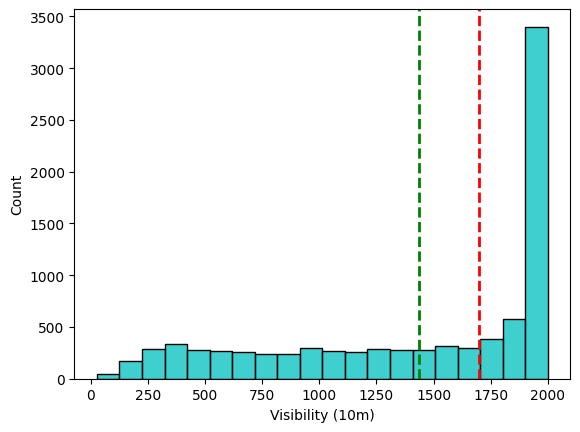

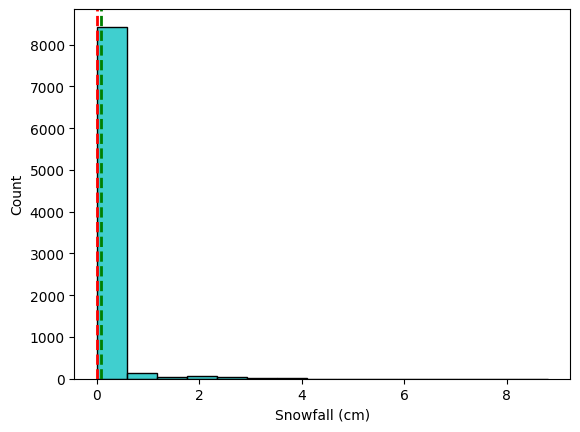

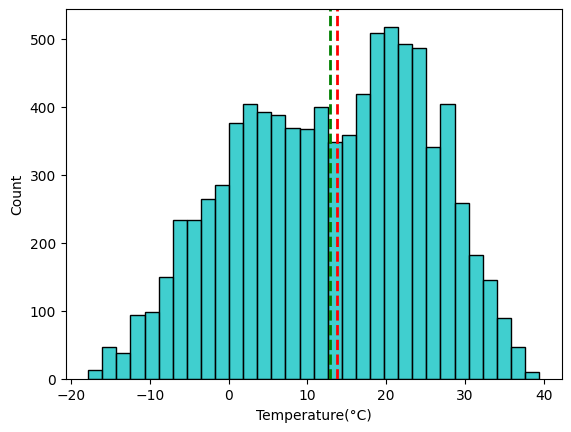

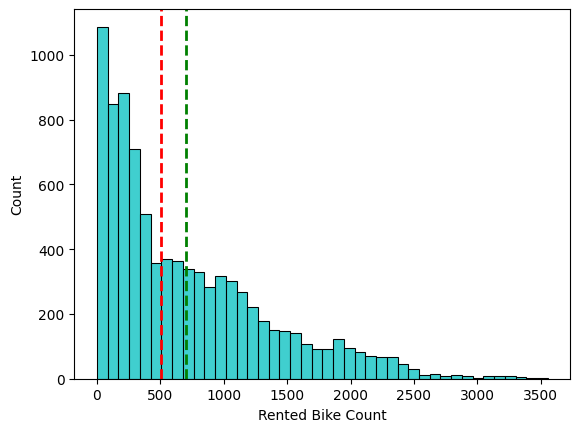

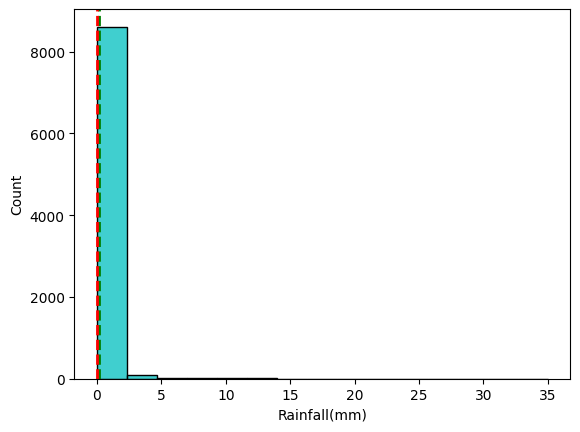

...

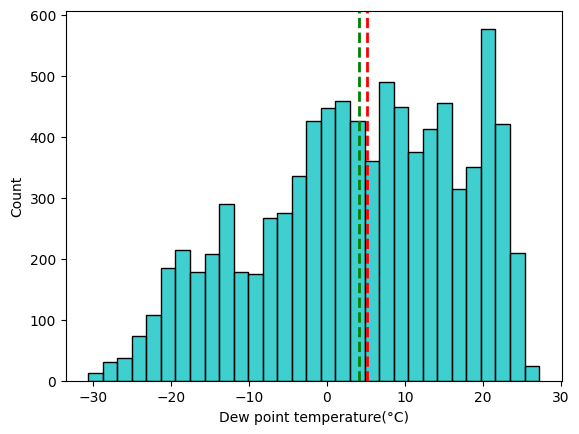

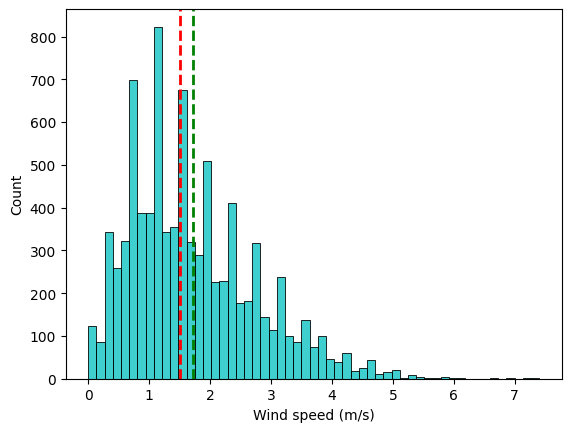

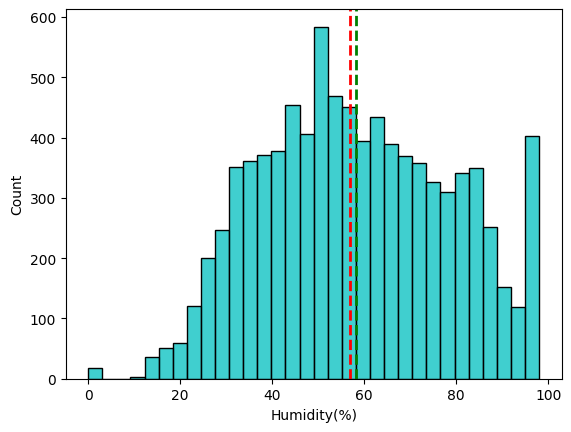

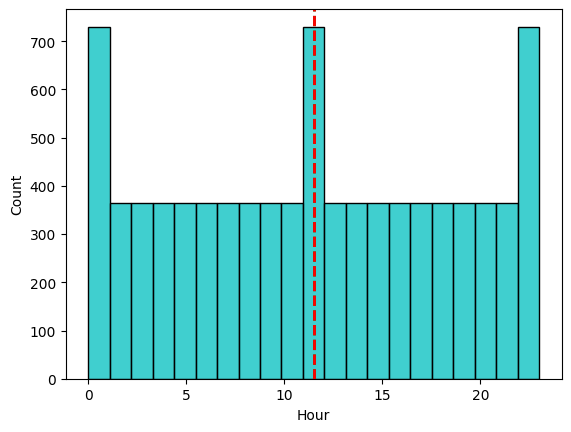

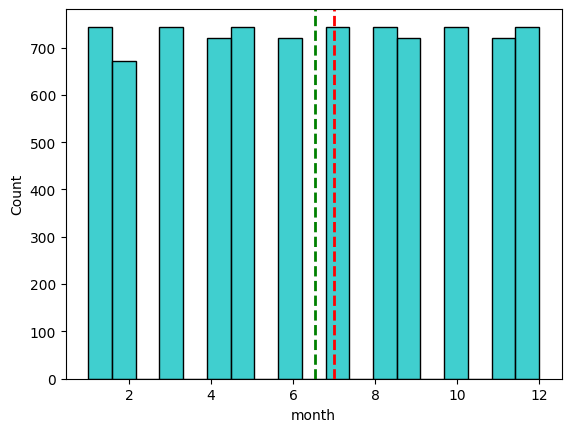

In [ ]:
#plotting histogram with mean and median

for col in column_list[:]:
  sns.histplot(Data_bsdp[col],color= 'c')
  plt.axvline(Data_bsdp[col].mean(), color='g', linestyle='dashed', linewidth=2)
  plt.axvline(Data_bsdp[col].median(), color='red', linestyle='dashed', linewidth=2)   
  plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen in this case is a histogram plot using seaborn library, which is used to display the distribution of a single numerical variable. This allows for visual comparison of the data distribution with the mean and median values.


##### 2. What is/are the insight(s) found from the chart?



*  From the histogram plots with mean and median lines, it can be observed that for features with skewed distributions, the mean and median values are also skewed. 


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The gained insights from the histogram plots with mean and median lines can potentially help create a positive business impact by providing information on the distribution of data and the characteristics of the mean and median values. This information can be used for various purposes, such as identifying potential data quality issues, understanding the central tendency of the data, and making informed decisions related to business strategies, pricing, and operations.




#### Chart - 13

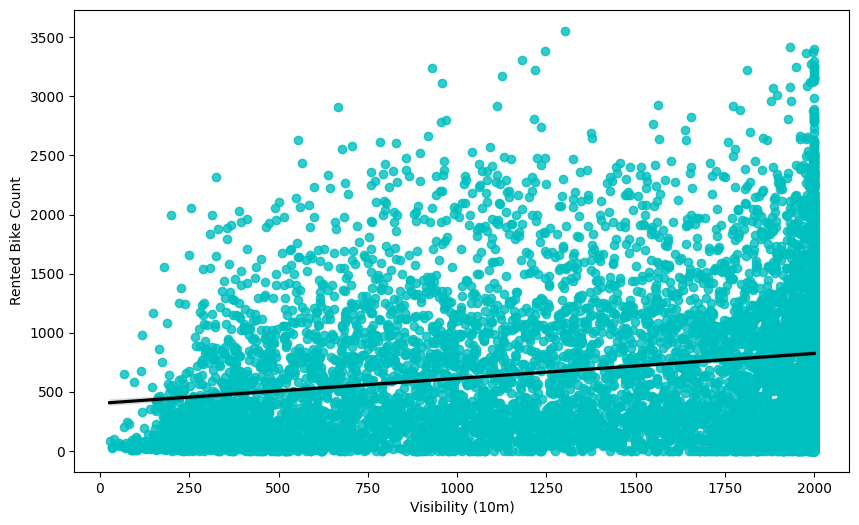

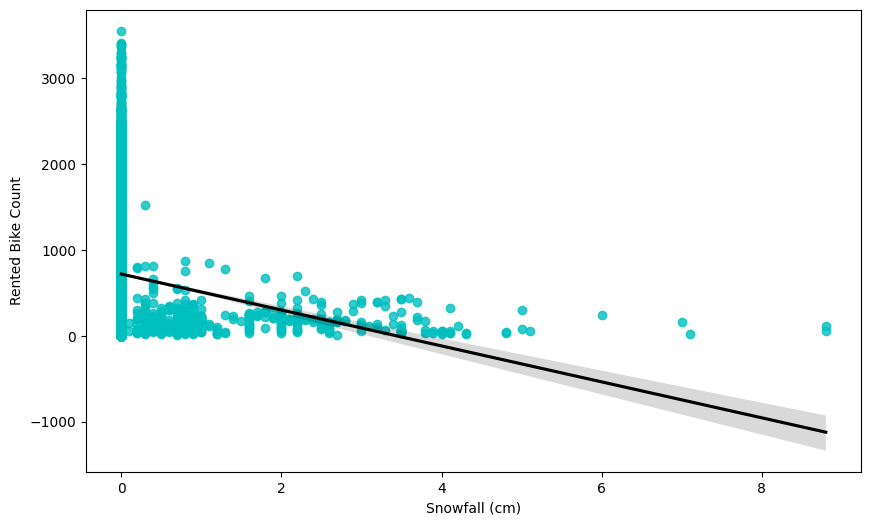

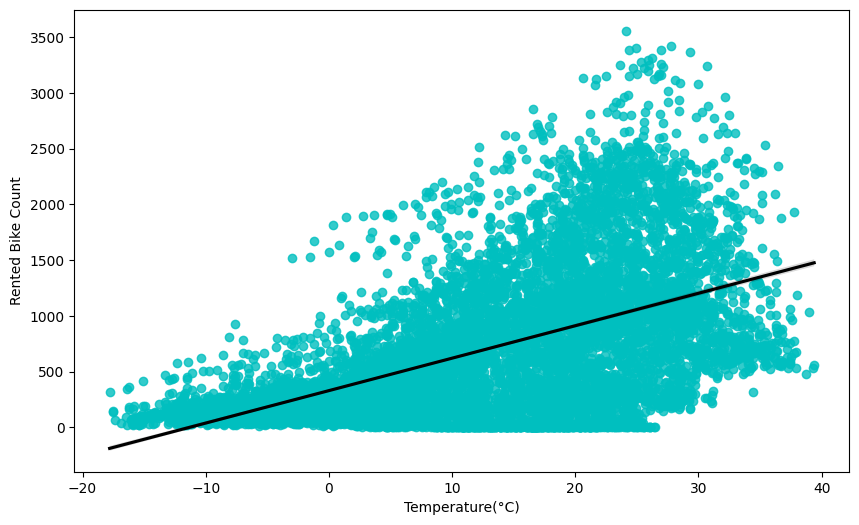

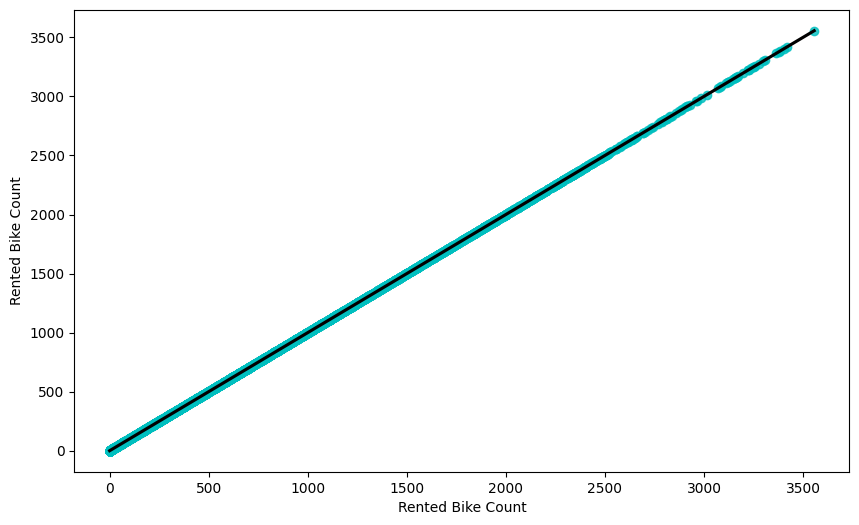

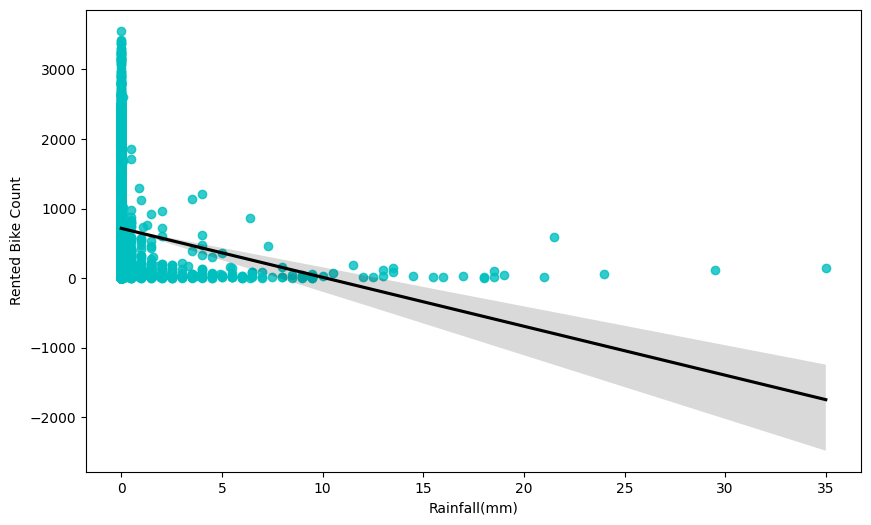

...

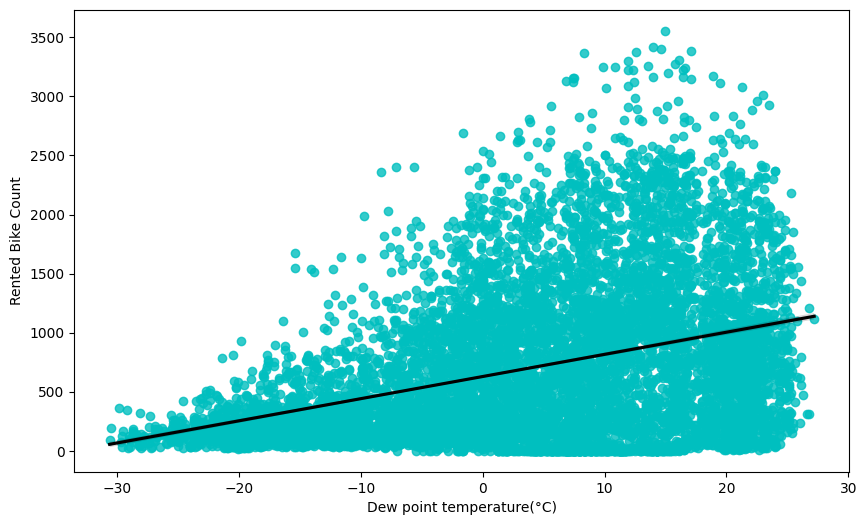

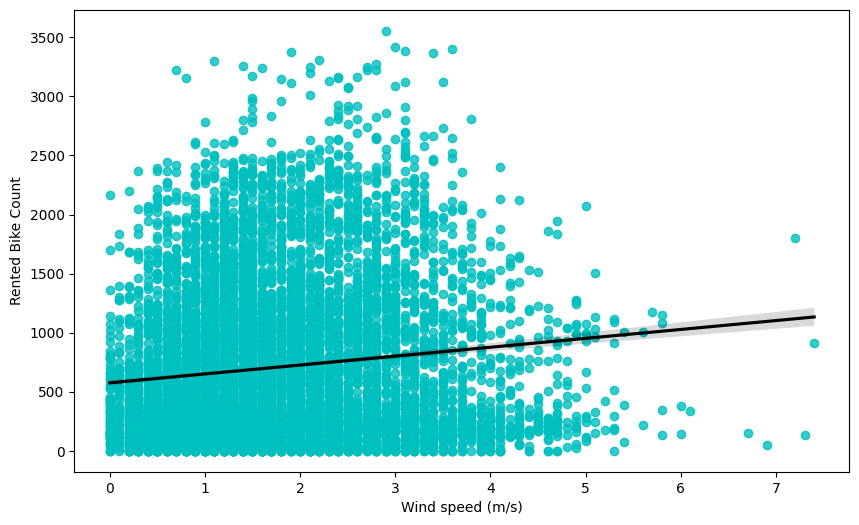

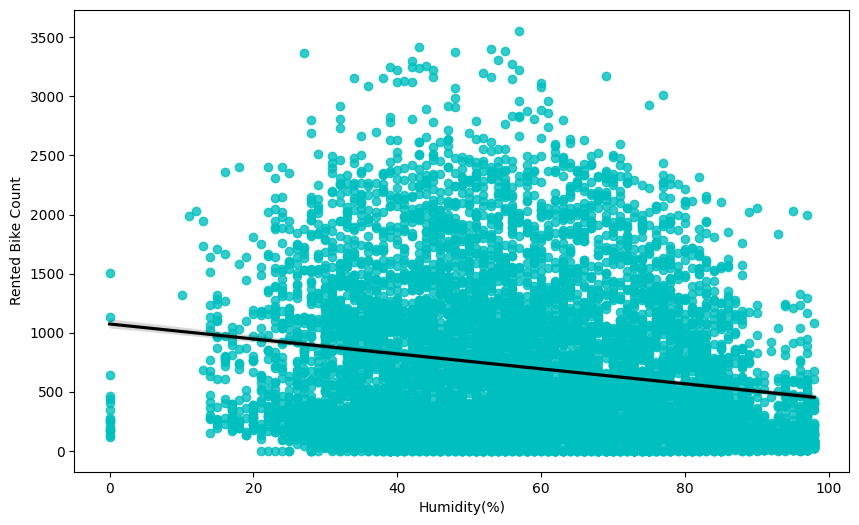

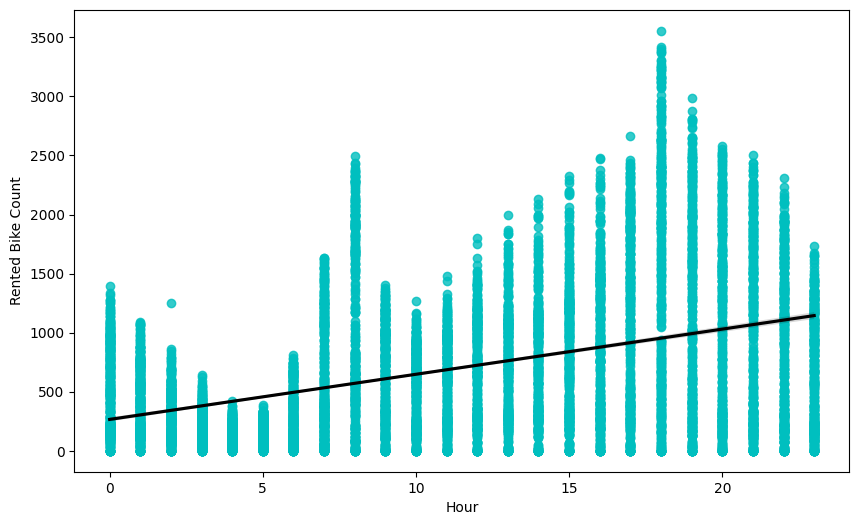

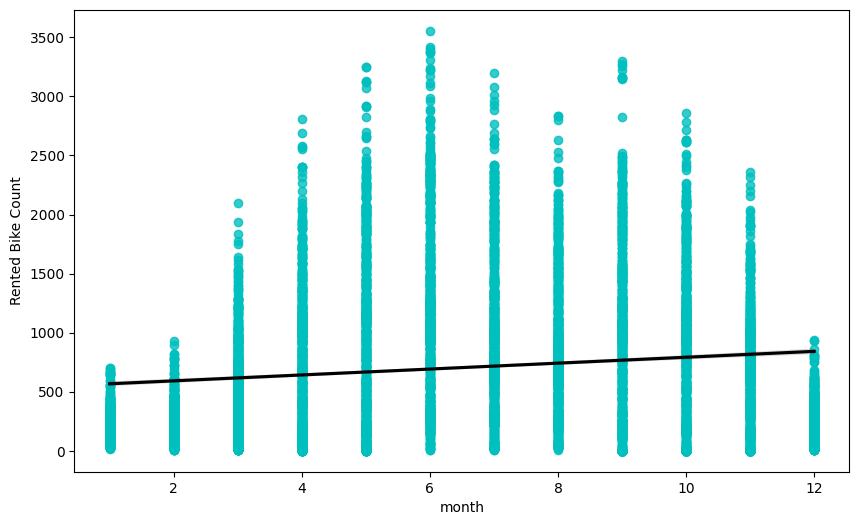

In [ ]:
#plotting the regression plot for all the numerical features
for col in column_list:
  fig,ax=plt.subplots(figsize=(10,6))
  sns.regplot(x=Data_bsdp[col],y=Data_bsdp['Rented Bike Count'],scatter_kws={"color": 'c'}, line_kws={"color": "black"})

##### 1. Why did you pick the specific chart?



*  The specific chart chosen in this case is a scatter plot with a regression line using seaborn library, which is used to visualize the relationship between two numerical variables. In this case, the independent variable (x-axis) represents the different features from the column_list, and the dependent variable (y-axis) represents the 'Rented Bike Count'. The regression line represents the trend or relationship between the two variables, and the scatter points represent the data points for each observation.



##### 2. What is/are the insight(s) found from the chart?




*  From the scatter plots with regression lines, it can be observed that some features such as 'Hour', 'Temperature', 'Wind_speed', 'Visibility', and 'Solar_Radiation' have a positive relationship with the 'Rented Bike Count'. This means that as these features increase, the 'Rented Bike Count' also tends to increase. On the other hand, features such as 'Rainfall', 'Snowfall', and 'Humidity' have a negative relationship with the 'Rented Bike Count', indicating that as these features increase, the 'Rented Bike Count' tends to decrease. 

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.





*    it is observed that certain features such as temperature or hour of the day have a positive impact on bike rental demand, businesses can optimize their pricing and promotional strategies during those times to maximize revenue.
*   if features such as rainfall or humidity have a negative impact on bike rental demand, businesses can plan for appropriate measures such as offering discounts or promotions to counteract the impact and maintain customer satisfaction.



#### Chart - 14 - Correlation Heatmap

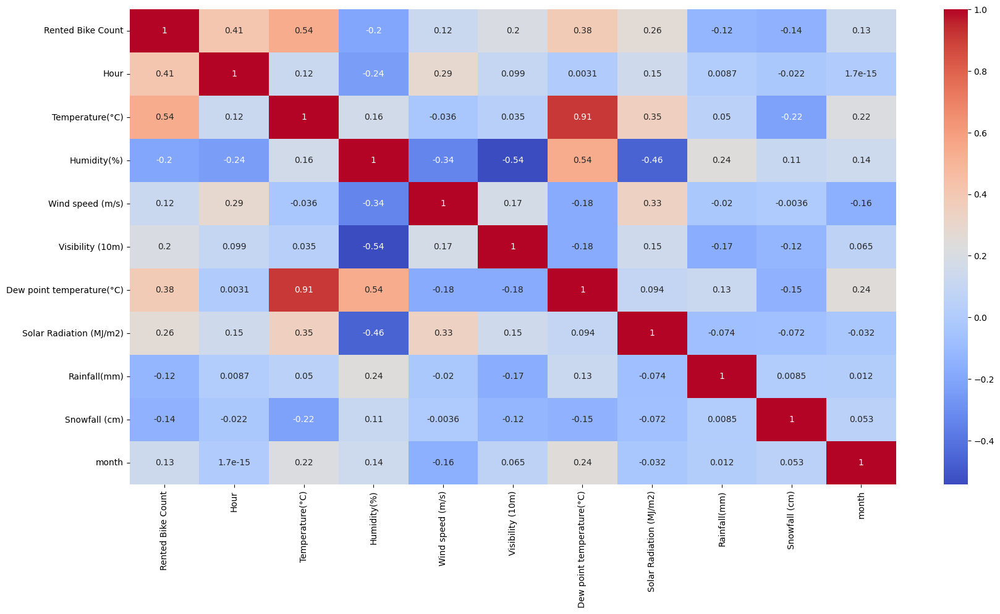

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize=(20,10))
sns.heatmap(Data_bsdp.corr(),annot=True,cmap="coolwarm")
plt.show()

##### 1. Why did you pick the specific chart?



*   The specific chart chosen in this case is a correlation heatmap using seaborn library, which is used to visualize the correlation between pairs of numerical variables in a matrix format. Each cell in the heatmap represents the correlation coefficient between two variables, with color indicating the strength and direction of the correlation.




##### 2. What is/are the insight(s) found from the chart?



*  Humidity has low correlation with visibility due to solar radiation.
*  Dew point temperature and temperature are highly related.  





#### Chart - 15 - Pair Plot 

Text(0.2, 0.4, 'Pairwise Plot')

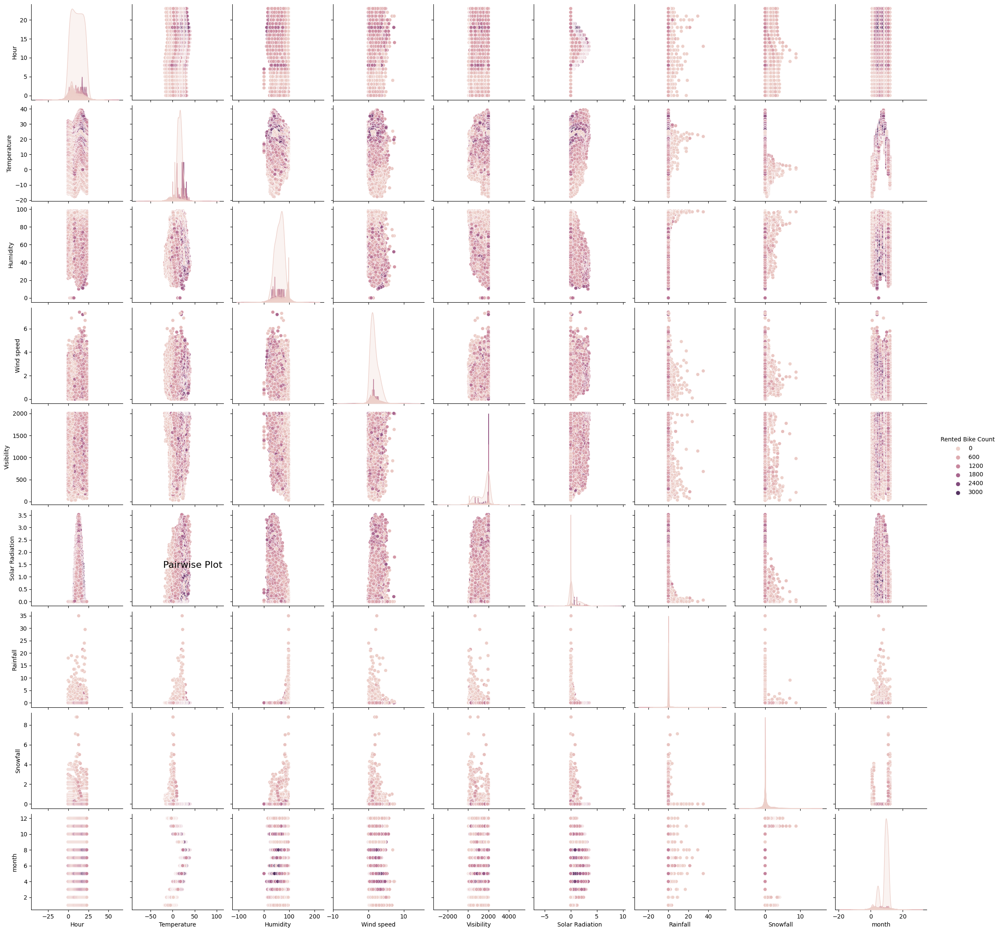

In [ ]:
# Pair Plot visualization code
Hour = Data_bsdp['Hour']
Temperature = Data_bsdp['Temperature(°C)']
Humidity = Data_bsdp['Humidity(%)']
Wind_speed =	Data_bsdp['Wind speed (m/s)']
Visibility = Data_bsdp['Visibility (10m)']
Solar_Radiation = Data_bsdp['Solar Radiation (MJ/m2)']
Rainfall = Data_bsdp['Rainfall(mm)']
Snowfall = Data_bsdp['Snowfall (cm)']
month = Data_bsdp['month']
rented_bike_count = Data_bsdp['Rented Bike Count']

df = pd.DataFrame({'Hour': Hour,
                   'Temperature': Temperature,
                   'Humidity': Humidity,
                   'Wind speed': Wind_speed,
                   'Visibility': Visibility,
                   'Solar Radiation': Solar_Radiation,
                   'Rainfall': Rainfall,
                   'Snowfall': Snowfall,
                   'month': month,
                   'Rented Bike Count': rented_bike_count})

p = sns.pairplot(df, hue='Rented Bike Count')
p.fig.suptitle("Pairwise Plot", x=0.2, y=0.4, fontsize=16)

##### 1. Why did you pick the specific chart?




*  The specific chart chosen in this case is a pair plot using seaborn library, which is used to visualize pairwise relationships between multiple variables in a dataset. It creates scatterplots for all possible combinations of the variables, and by using hue parameter, it also adds a categorical variable as color to distinguish different categories of the data points.

##### 2. What is/are the insight(s) found from the chart?

*  Hour: There is a pattern of higher bike rentals during certain hours of the day, indicating potential time-dependent trends in bike rentals.
*  Temperature: There is a positive correlation between temperature and bike rentals, suggesting that higher temperatures may lead to higher bike rentals.
*  Humidity: There is a negative correlation between humidity and bike rentals, indicating that higher humidity levels may lead to lower bike rentals.
*  Wind speed: There does not seem to be a strong correlation between wind speed and bike rentals.
*  Visibility: There does not seem to be a strong correlation between visibility and bike rentals.
*  Solar Radiation: There is a positive correlation between solar radiation and bike rentals, suggesting that higher solar radiation levels may lead to higher bike rentals.
*  Rainfall: There is a negative correlation between rainfall and bike rentals, indicating that higher rainfall levels may lead to lower bike rentals.
*  Snowfall: There does not seem to be a strong correlation between snowfall and bike rentals.
*  Month: There is a pattern of higher bike rentals during certain months of the year, indicating potential seasonal trends in bike rentals.



Regenerate response

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.



*  **Null Hypothesis (H0)**: There is no significant relationship between weather conditions (e.g., temperature, humidity, wind speed, etc.) and bike sharing demand.
*   **Alternative Hypothesis (Ha)**: There is a significant relationship between weather conditions and bike sharing demand.



#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats


# Extract temperature and bike sharing demand columns
temperature = Data_bsdp['Temperature(°C)']
bike_demand = Data_bsdp['Rented Bike Count']

# Perform Pearson's correlation coefficient test
corr, p_value = stats.pearsonr(temperature, bike_demand)

# Set the significance level (alpha)
alpha = 0.05

# Print the results
print("Pearson's correlation coefficient: {:.2f}".format(corr))
print("p-value: {:.4f}".format(p_value))

# Check if the p-value is less than the significance level
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant relationship between temperature and bike sharing demand.")
else:
    print("Fail to reject the null hypothesis. There is no significant relationship between temperature and bike sharing demand.")


Pearson's correlation coefficient: 0.54
p-value: 0.0000
Reject the null hypothesis. There is a significant relationship between temperature and bike sharing demand.


##### Which statistical test have you done to obtain P-Value?



*   The statistical test used in the example code provided is Pearson's correlation coefficient test, which is a measure of the linear relationship between two variables. The resulting p-value from this test is used to determine the significance of the correlation between temperature and bike sharing demand.



##### Why did you choose the specific statistical test?



*   It is widely used for assessing the strength and direction of a linear relationship between two variables. It provides a numerical value (r) that ranges from -1 to 1, where -1 indicates a perfect negative linear relationship, 1 indicates a perfect positive linear relationship, and 0 indicates no linear relationship. This makes it easy to interpret and understand the strength and direction of the relationship between temperature and bike sharing demand.


## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values



*   From the EDA analysis we can see there is no missing values.




#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer Here.

### 2. Handling Outliers

In [ ]:
# Handling Outliers & Outlier treatments
outlier_cols = list(set(Data_bsdp.describe().columns)-{'Rented Bike Count','Hour'})
outlier_cols

['Visibility (10m)',
 'Rainfall(mm)',
 'Wind speed (m/s)',
 'Snowfall (cm)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Humidity(%)',
 'Temperature(°C)',
 'month']

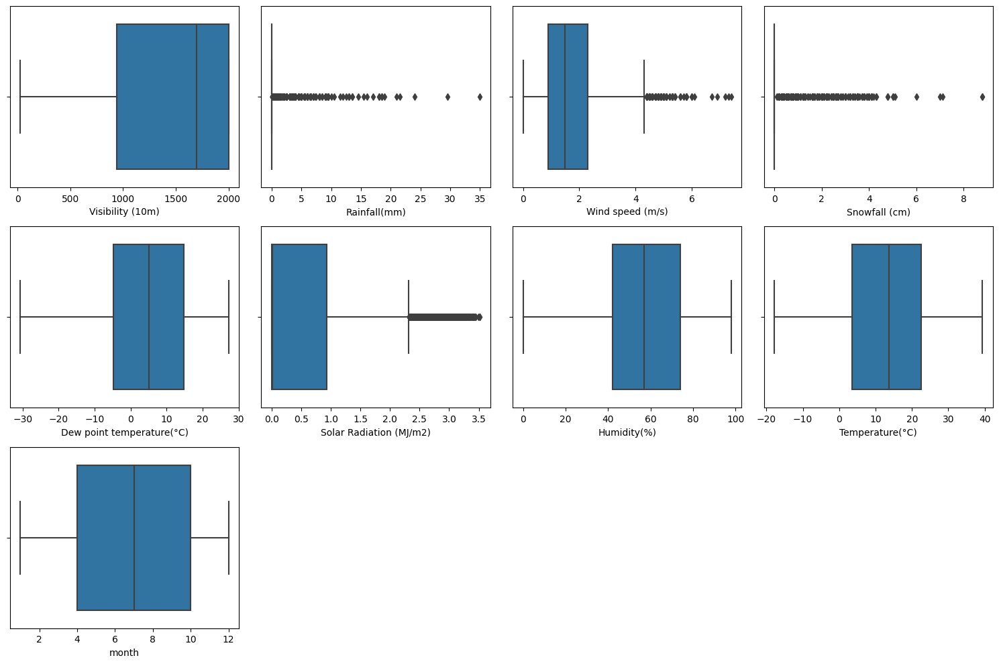

In [ ]:
#Creating a boxplot to detect columns with outliers
plt.figure(figsize=(15,10))  # Increase figure size to 15x10

# Determine the number of rows and columns for subplots
num_cols = len(outlier_cols)
num_rows = math.ceil(num_cols / 4)  # Use math.ceil() to round up the number of rows

# Create subplots
for index, cols in enumerate(outlier_cols):
    plt.subplot(num_rows, 4, index+1)  # Use updated subplot layout
    sns.boxplot(x=Data_bsdp[cols])
plt.tight_layout()
plt.show()




*   From the upper box plot we can see that **Wind speed, Solar radiation,** **Snowfall** and **Rainfall** contains outlier.




In [ ]:
#list of columns that contains outliers
outlier_col = ['Rainfall(mm)','Wind speed (m/s)','Snowfall (cm)','Solar Radiation (MJ/m2)']
outlier_col

['Rainfall(mm)',
 'Wind speed (m/s)',
 'Snowfall (cm)',
 'Solar Radiation (MJ/m2)']

In [ ]:
# finding the inter-quartile range 
Q1 = Data_bsdp[outlier_col].quantile(0.25)
Q3 = Data_bsdp[outlier_col].quantile(0.75)
IQR = Q3-Q1
IQR

Rainfall(mm)               0.00
Wind speed (m/s)           1.40
Snowfall (cm)              0.00
Solar Radiation (MJ/m2)    0.93
dtype: float64

In [ ]:
#upper and lower fence for outlier removal
Upper_fence = Q3 + (1.5*IQR)
Lower_fence = Q1 - (1.5*IQR)

In [ ]:
#Detecting and removing the outliers
Data_bsdp[outlier_cols] = Data_bsdp[outlier_cols][~((Data_bsdp[outlier_cols] < Lower_fence) | (Data_bsdp[outlier_cols] > Upper_fence))]

In [ ]:
Data_bsdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8599 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8119 non-null   float64
 8   Rainfall(mm)               8232 non-null   float64
 9   Snowfall (cm)              8317 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   int64



*   Afetr removal of outliers some null values created in these four column , in these columns we will fill with the median value of each column.




In [ ]:
#Creating a function for fill the null values
def fill_null(outlier_col):
  for col in outlier_col:
    Data_bsdp[col].fillna(Data_bsdp[col].median(),inplace=True)

In [ ]:
fill_null(outlier_col)

In [ ]:
#inspecting if the filling is successfull
Data_bsdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   int64

##### What all outlier treatment techniques have you used and why did you use those techniques?



*   For handling the outliers we are using the **IQR (Interquartile Range) Method**.
*  IQR Method is for

1.   Robustness to Extreme Values
2.   Simple and Easy to Implement

1.   Flexibility in Threshold Selection
2.   Preservation of Data Distribution







### 3. Categorical Encoding

In [ ]:
# Encode your categorical columns
#first we encode the Season column and remove the Season column
Data_bsdp['Winter'] = np.where(Data_bsdp['Seasons']=='Winter', 1, 0)
Data_bsdp['Spring'] = np.where(Data_bsdp['Seasons']=='Spring', 1, 0)
Data_bsdp['Summer'] = np.where(Data_bsdp['Seasons']=='Summer', 1, 0)
Data_bsdp['Autumn'] = np.where(Data_bsdp['Seasons']=='Autumn', 1, 0)

Data_bsdp.drop(columns=['Seasons'],axis=1,inplace=True)


In [ ]:
#Encoding for Holiday column
Data_bsdp['Holiday'] = np.where(Data_bsdp['Holiday']=='Holiday',1,0)

In [ ]:
#Encoding for Functioning day
Data_bsdp['Functioning Day'] = np.where(Data_bsdp['Functioning Day']=='Yes',1,0)

In [ ]:
#Encoding for week
Data_bsdp['week'] = np.where(Data_bsdp['week']=='weekend',1,0)

In [ ]:
#inspecting encoding done or not
Data_bsdp.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,month,week,Winter,Spring,Summer,Autumn
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1,12,0,1,0,0,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1,12,0,1,0,0,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,12,0,1,0,0,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,1,12,0,1,0,0,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,1,12,0,1,0,0,0


#### What all categorical encoding techniques have you used & why did you use those techniques?



*  In the given code, one-hot encoding technique is used to encode the categorical column.
*  One-hot encoding is a commonly used technique for handling nominal categorical variables in machine learning models as it creates binary columns for each category, allowing the model to capture the presence or absence of each category as a separate feature. This avoids any arbitrary ordinal relationship being imposed on the categories, which could potentially mislead the model during training.





### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

*   Feature Manipulation are already done in upper part.

#### 2. Feature Selection

##### What all feature selection methods have you used  and why?

##### Which all features you found important and why?

## Creating Function to train linear models

In [ ]:
mean_sq_error = []
root_mean_sq_error = []
r2_sq_list = []
adj_r2_sq_list = []

def linear_model(model, X_train, y_train, X_test, y_test):
    """
    Fit a regression model and evaluate its performance using various metrics.

    Parameters:
        -- model (object): Regression model object to be fit
        -- X_train (numpy array or pandas DataFrame): Training features
        -- y_train (numpy array or pandas Series): Training target variable
        -- X_test (numpy array or pandas DataFrame): Testing features
        -- y_test (numpy array or pandas Series): Testing target variable

    Returns:
        -- None
    """
    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Get Metrics
    y_pred_test = model.predict(X_test)
    y_pred_train= model.predict(X_train)

    mse = mean_squared_error(y_test, y_pred_test)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred_test)
    adj_r2 = 1 - (1 - r2) * ((X_test.shape[0] - 1) / (X_test.shape[0] - X_test.shape[1] - 1))

    mean_sq_error.append(mse)
    root_mean_sq_error.append(rmse)
    r2_sq_list.append(r2)
    adj_r2_sq_list.append(adj_r2)
    
    mse1 = mean_squared_error(y_train, y_pred_train)
    rmse1 = np.sqrt(mse1)
    r2_1 = r2_score(y_train, y_pred_train)
    adj_r2_1 = 1 - (1 - r2_1) * ((X_train.shape[0] - 1) / (X_train.shape[0] - X_train.shape[1] - 1))

    mean_sq_error.append(mse1)
    root_mean_sq_error.append(rmse1)
    r2_sq_list.append(r2_1)
    adj_r2_sq_list.append(adj_r2_1)

    print('\n================Evaluation Metrics for test=========================\n')
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("R2 Score:", r2)
    print("Adjusted R2 Score:", adj_r2)
    
    print('\n================Evaluation Graph for test==========================\n')
    plt.figure(figsize=(20, 10))
    plt.plot(np.array(y_test[:100]))
    plt.plot(y_pred_test[:100])
    plt.legend(["Actual", "Predicted"], prop={'size': 20})
    plt.show()

    print('\n================Evaluation Metrics for train=========================\n')
    print("Mean Squared Error (MSE):", mse1)
    print("Root Mean Squared Error (RMSE):", rmse1)
    print("R2 Score:", r2_1)
    print("Adjusted R2 Score:", adj_r2_1)

    print('\n================Evaluation Graph for train==========================\n')
    plt.figure(figsize=(20, 10))
    plt.plot(np.array(y_train[:100]))
    plt.plot(y_pred_train[:100])
    plt.legend(["Actual", "Predicted"], prop={'size': 20})
    plt.show()

    residuals = y_test - y_pred_test

    print('\n================Evaluation Graph for Residuals vs. Predicted Values==========================\n')
    # Plot residuals against predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred_test, residuals)
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs. Predicted Values')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.show()


 


### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?



*   Data transformed is important,and for that we are going to use standard scaler.
*  StandardScaler is a commonly used data transformation technique in machine learning because it helps to standardize the distribution of data, brings all the features to a similar scale, and can improve the performance of many statistical and machine learning algorithms.



In [ ]:
#Assign the value in X and Y
X = Data_bsdp.drop(columns=['Rented Bike Count'], axis=1)
y = np.sqrt(Data_bsdp['Rented Bike Count'])

### 6. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
print(X_train.shape)
X_test.shape

(6570, 17)


(2190, 17)

##### What data splitting ratio have you used and why?



*  In the given code, a test size of 0.25 (or 25%) is used for splitting the data into train and test sets using the train_test_split function from the scikit-learn library. This means that 75% of the data is used for training the model (X_train, y_train), and 25% of the data is used for testing the model (X_test, y_test).
*  A 75%/25% split (75% for training and 25% for testing) is a commonly used ratio in many machine learning projects. It strikes a good balance between having enough data for training and having a reasonable amount of data for testing to evaluate the model's performance. The random_state parameter is set to 0 to ensure reproducibility, as the same random seed will be used for splitting the data each time the code is executed, resulting in consistent train-test splits.



### 7. Data Scaling

In [ ]:
# Scaling your data 
std = StandardScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

 
##### Which method have you used to scale you data and why?



*  The code uses the StandardScaler method from the scikit-learn library to scale the features in the dataset. The standard scaler scales the data such that it has a mean of zero and a standard deviation of one, which helps to normalize the features and make them more comparable to each other. This method is often used in machine learning models as it can improve model performance and accuracy.



## ***7. ML Model Implementation***

### **Linear Regresseion**


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 55.94700716589031
Root Mean Squared Error (RMSE): 7.479773202837792
R2 Score: 0.6458297082089872
Adjusted R2 Score: 0.6430576571222251

================Evaluation Graph for test==========================



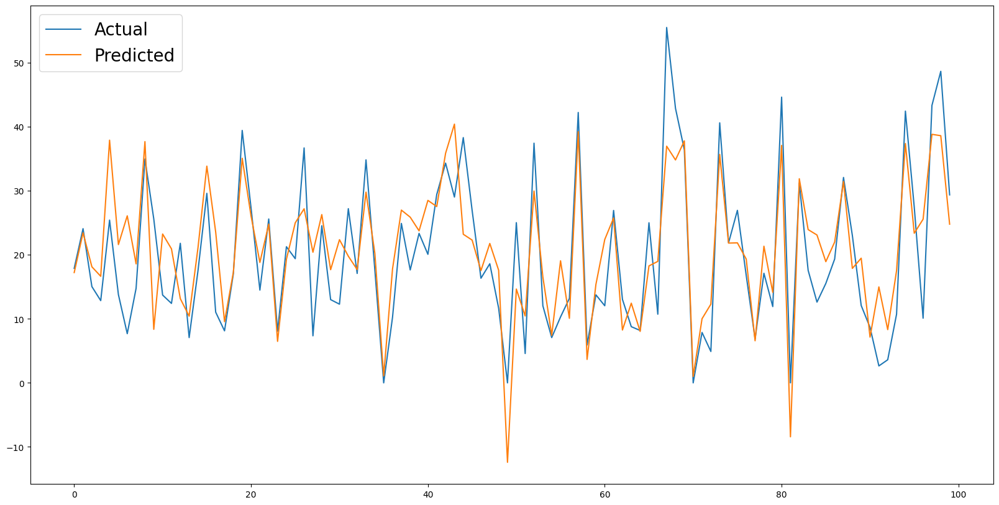


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 55.71931751915437
Root Mean Squared Error (RMSE): 7.464537327869315
R2 Score: 0.6381643489476908
Adjusted R2 Score: 0.6372255201827505

================Evaluation Graph for train==========================



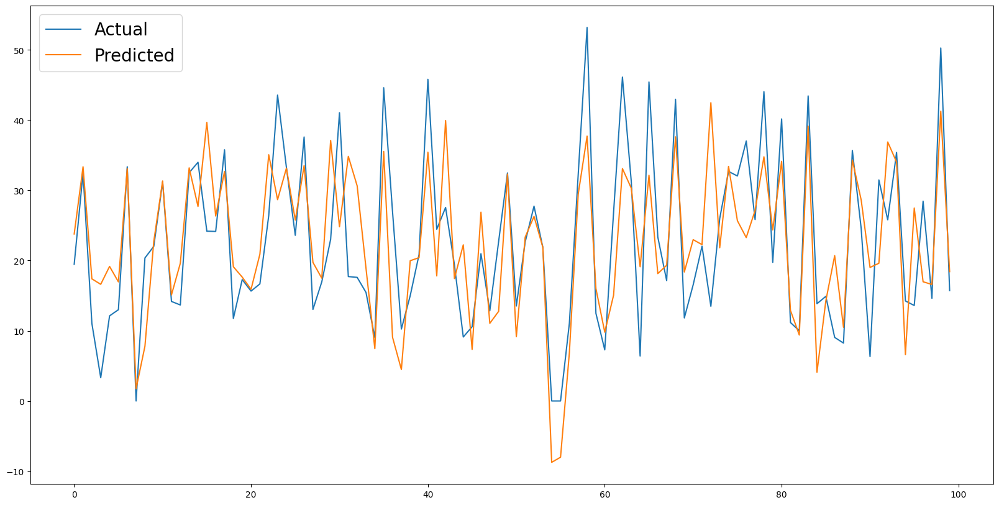


================Evaluation Graph for Residuals vs. Predicted Values==========================



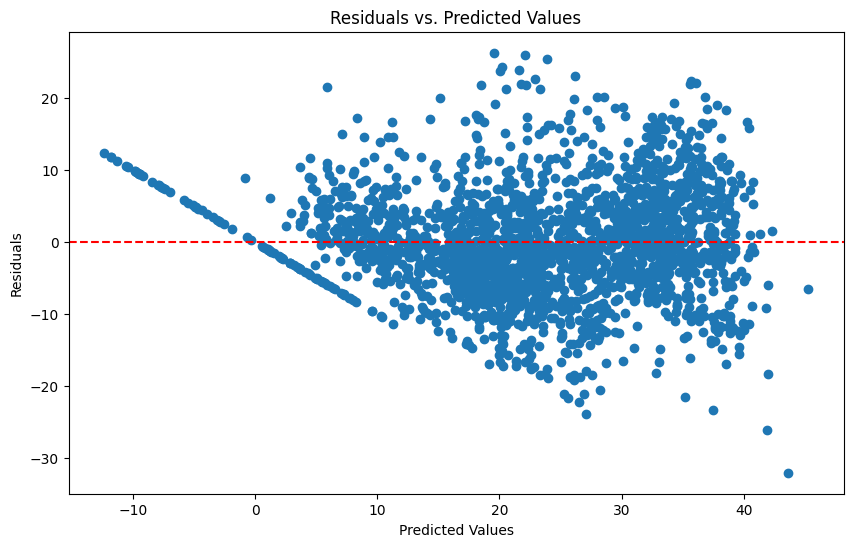

In [ ]:
#Implementation
L_model= LinearRegression()

linear_model(L_model, X_train, y_train, X_test, y_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The ML model used is Linear Regression.

The performance of the model is evaluated using several evaluation metrics:

* Mean Squared Error (MSE)
* Root Mean Squared Error (RMSE)
* R2 Score 
* Adjusted R2 Score



*  From the evaluation metric score chart, we can see that the model's performance is reasonable. The R2 score for both test and train data is above 0.6, which indicates that around 60% of the variation in the dependent variable is explained by the independent variables. 
*   The RMSE value is also relatively low, which means that the model's predictions are relatively close to the actual values. However, there is still scope for improvement as the model's performance can be further enhanced by fine-tuning its hyperparameters or by using more complex models.



##Ridge Regression

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 55.946362983206804
Root Mean Squared Error (RMSE): 7.47973014106838
R2 Score: 0.6458337861817072
Adjusted R2 Score: 0.6430617670127794

================Evaluation Graph for test==========================



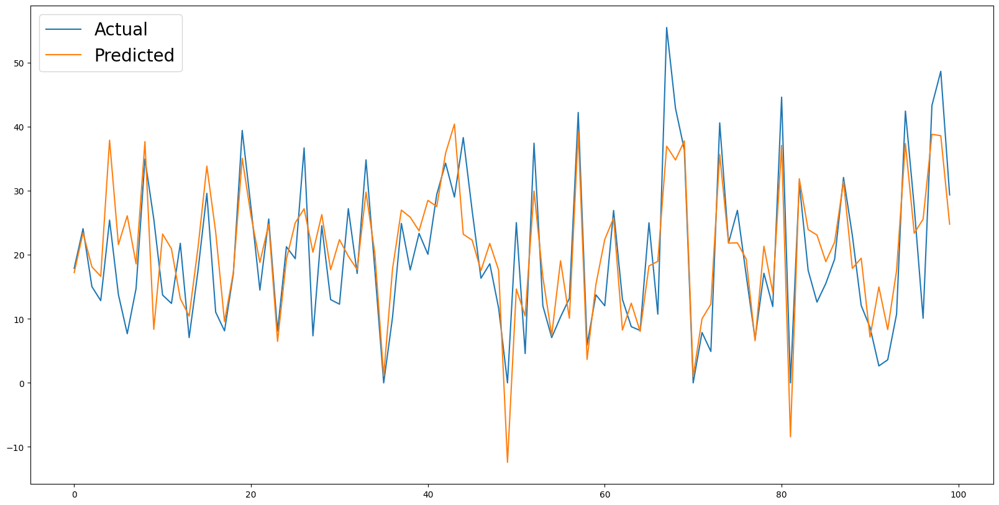


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 55.71932226261401
Root Mean Squared Error (RMSE): 7.464537645602305
R2 Score: 0.6381643181441403
Adjusted R2 Score: 0.6372254892992761

================Evaluation Graph for train==========================



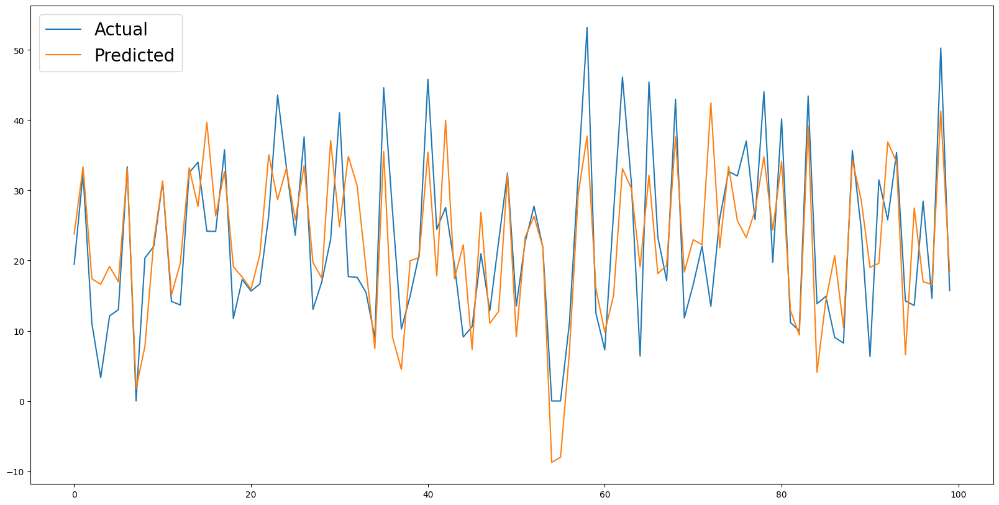


================Evaluation Graph for Residuals vs. Predicted Values==========================



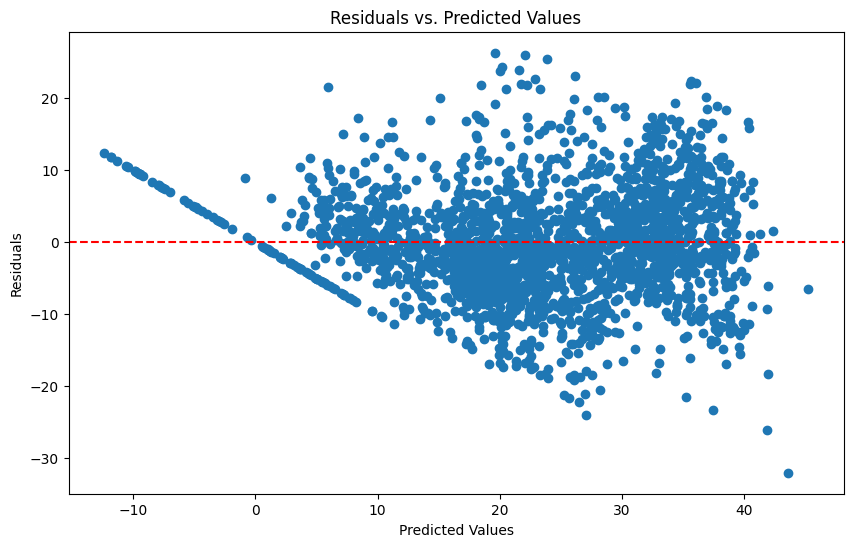

In [ ]:
# Visualizing evaluation Metric Score chart
Ridge_R = Ridge(alpha = 0.1)

linear_model(Ridge_R, X_train, y_train, X_test, y_test)

#### 2. Cross- Validation & Hyperparameter Tuning


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 55.92856095974152
Root Mean Squared Error (RMSE): 7.478540028624672
R2 Score: 0.6459464811794302
Adjusted R2 Score: 0.6431753440615897

================Evaluation Graph for test==========================



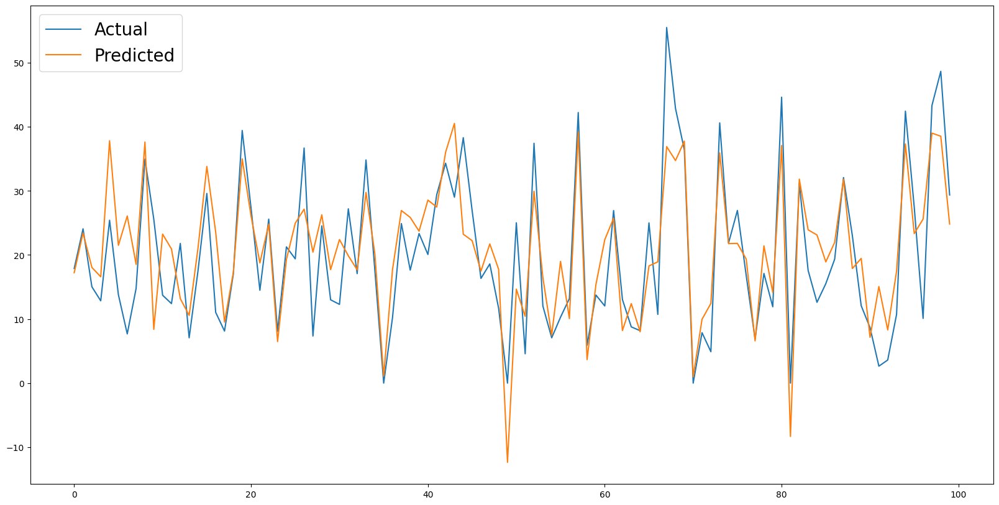


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 55.72817995934434
Root Mean Squared Error (RMSE): 7.4651309405357615
R2 Score: 0.6381067971513152
Adjusted R2 Score: 0.6371678190608958

================Evaluation Graph for train==========================



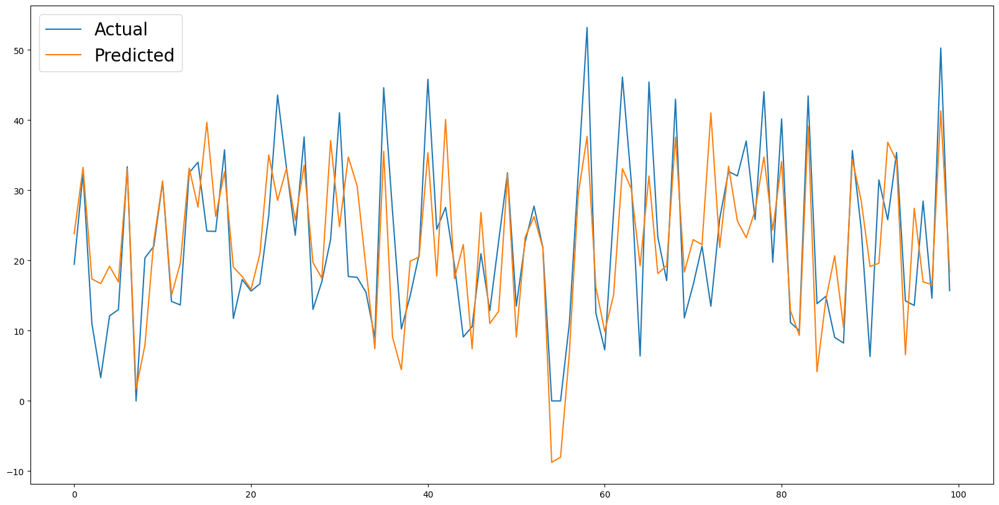


================Evaluation Graph for Residuals vs. Predicted Values==========================



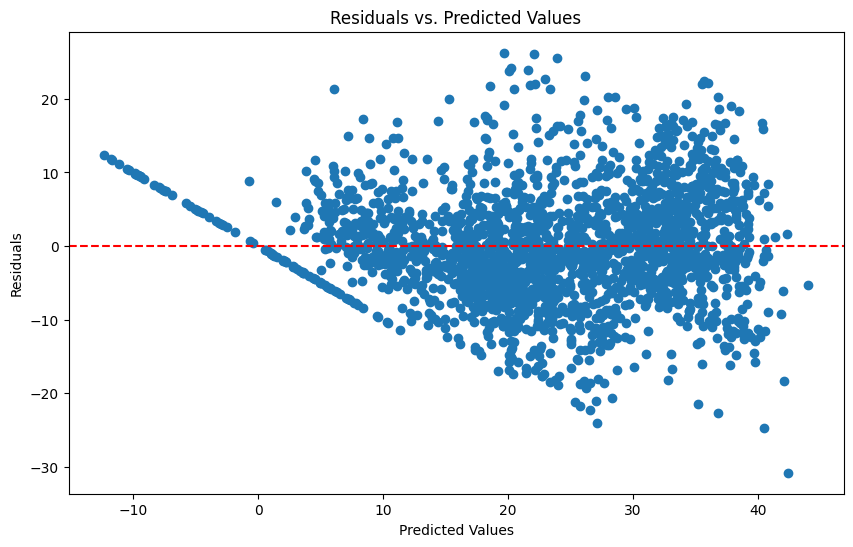

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,60,100,0.5,1.5,1.6,1.7,1.8,1.9]}
Ridge_grid = GridSearchCV(Ridge_R, parameters, scoring='neg_mean_squared_error', cv=3)
# Fit the Algorithm
linear_model(Ridge_grid, X_train, y_train, X_test, y_test)


##### Which hyperparameter optimization technique have you used and why?



*  In this case, GridSearch CV was used for hyperparameter optimization. GridSearch CV is a popular technique for tuning hyperparameters by exhaustively searching over a defined parameter grid. It performs an exhaustive search over a specified parameter values for an estimator, and returns a model with the best performance based on the chosen scoring metric.



##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.



*  Yes, there was a slight improvement in the model's performance after hyperparameter tuning. The mean squared error decreased from 55.95 to 55.93 and the R2 score increased from 0.645 to 0.646.


#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

* The evaluation metrics used in the model (MSE, RMSE, R2 score, and Adjusted R2 score) provide a measure of the model's performance. A lower MSE and RMSE and a higher R2 score indicate a better fit of the model to the data. The adjusted R2 score takes into account the number of predictors used in the model and adjusts the R2 score accordingly.

* In a business context, these evaluation metrics provide information on how well the model is performing and its ability to predict future values. A better-performing model would have a lower RMSE, meaning the model's predictions are more accurate. The R2 score indicates the proportion of variation in the dependent variable that can be explained by the model, which is crucial in business decision-making. A high R2 score means the model can explain a large proportion of the variation in the dependent variable, making it more reliable for making business decisions.

## Lasso Regression

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 63.73670142985209
Root Mean Squared Error (RMSE): 7.983526879133813
R2 Score: 0.5965173601462985
Adjusted R2 Score: 0.5933593468509426

================Evaluation Graph for test==========================



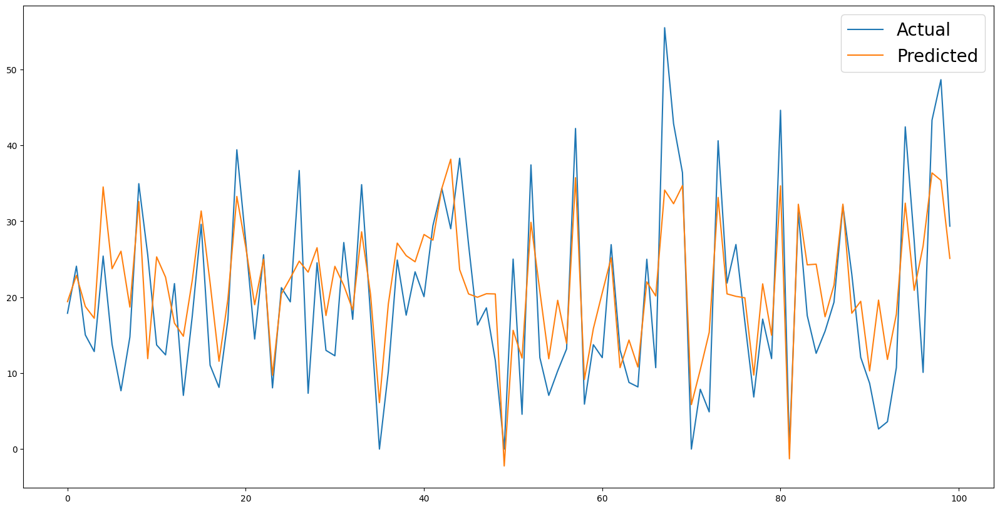


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 62.99101816045572
Root Mean Squared Error (RMSE): 7.936688110317535
R2 Score: 0.590942655413877
Adjusted R2 Score: 0.5898813039398287

================Evaluation Graph for train==========================



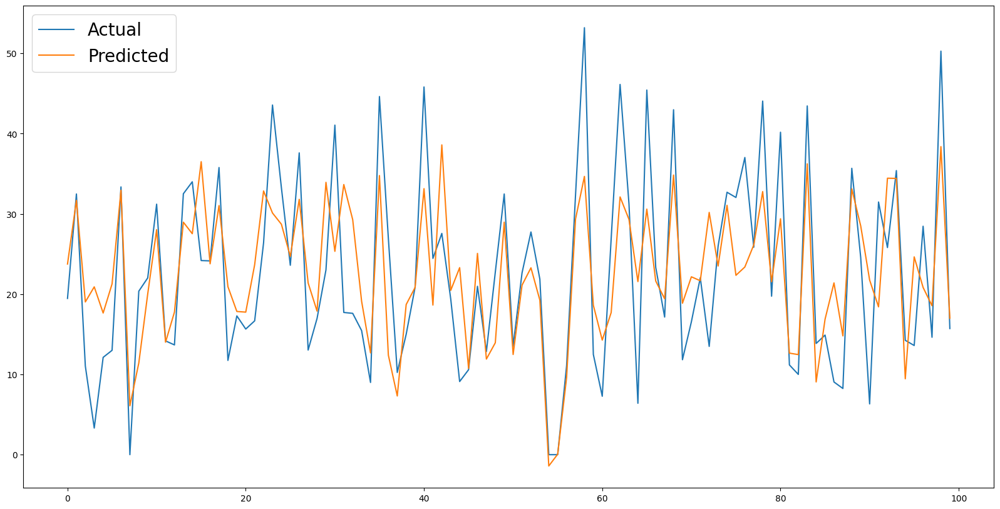


================Evaluation Graph for Residuals vs. Predicted Values==========================



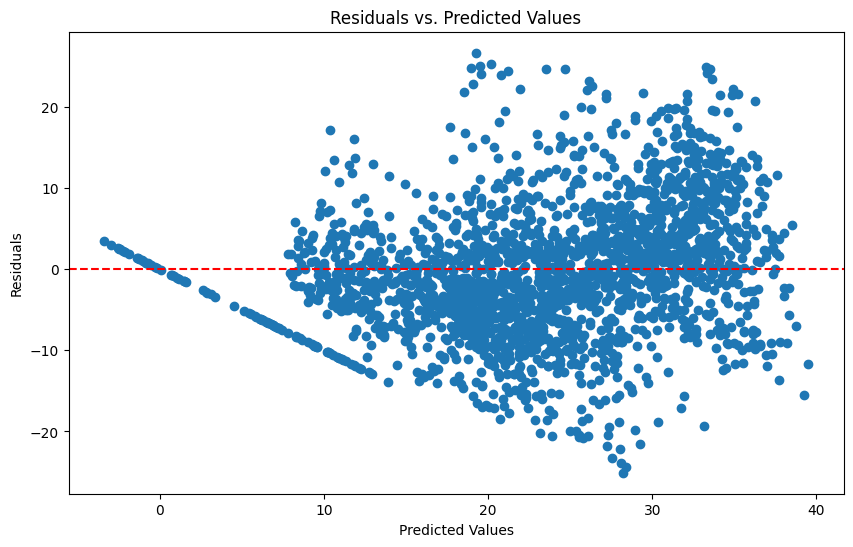

In [ ]:
# ML Model - 3 Implementation
Lasso_R = Lasso(alpha = 1, max_iter= 1000)
# Fit the Algorithm
linear_model(Lasso_R, X_train, y_train, X_test, y_test)

#### 2. Cross- Validation & Hyperparameter Tuning


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 55.93876242196492
Root Mean Squared Error (RMSE): 7.479222046574424
R2 Score: 0.6458819012307362
Adjusted R2 Score: 0.6431102586528921

================Evaluation Graph for test==========================



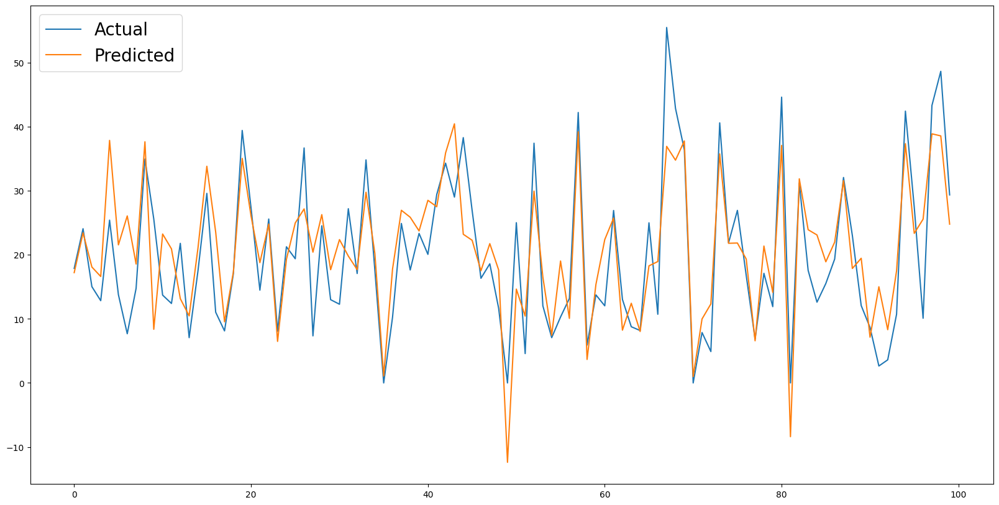


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 55.72050288715151
Root Mean Squared Error (RMSE): 7.464616727411496
R2 Score: 0.6381566512869856
Adjusted R2 Score: 0.6372178025494823

================Evaluation Graph for train==========================



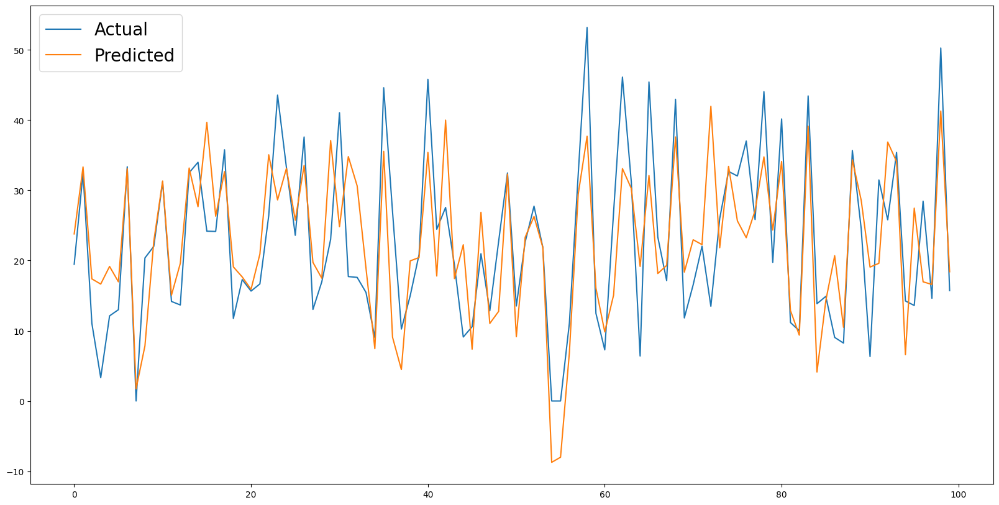


================Evaluation Graph for Residuals vs. Predicted Values==========================



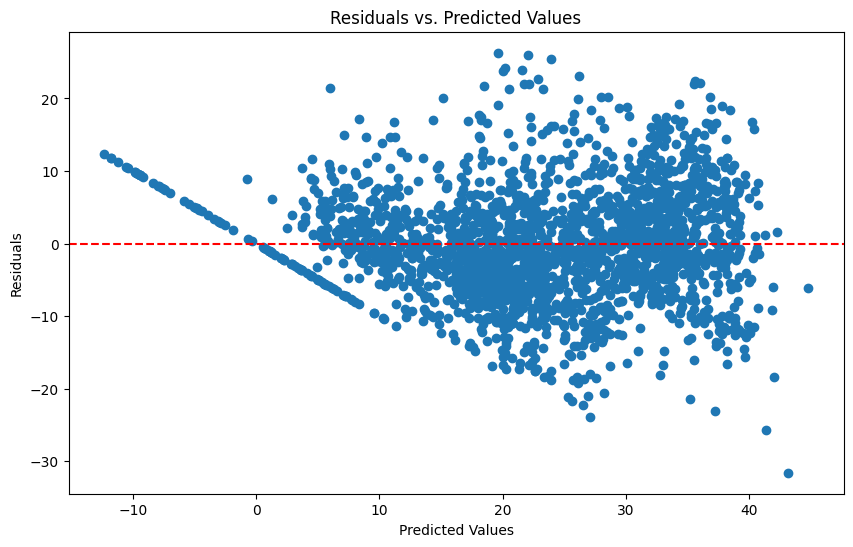

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]}
Lasso_grid = GridSearchCV(Lasso_R, parameters, scoring='neg_mean_squared_error', cv=5)
# Fit the Algorithm
linear_model(Lasso_grid, X_train, y_train, X_test, y_test)
# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

* In the Lasso regression implementation, GridSearchCV hyperparameter optimization technique has been used. GridSearchCV is a technique that searches for the best combination of hyperparameters from a grid of possible hyperparameter values. In this approach, the algorithm is trained and evaluated for all possible combinations of hyperparameters provided in the grid, and the combination that gives the best performance metric is chosen as the optimal set of hyperparameters.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

* Yes, there is an improvement in the evaluation metrics after hyperparameter optimization. The mean squared error (MSE) decreased from 63.736 to 55.938, the root mean squared error (RMSE) decreased from 7.983 to 7.479, and the R2 score increased from 0.596 to 0.645. The adjusted R2 score also improved from 0.593 to 0.643.

## ElasticNet Regression


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 56.542345720446505
Root Mean Squared Error (RMSE): 7.519464457023951
R2 Score: 0.6420609412943173
Adjusted R2 Score: 0.6392593924922931

================Evaluation Graph for test==========================



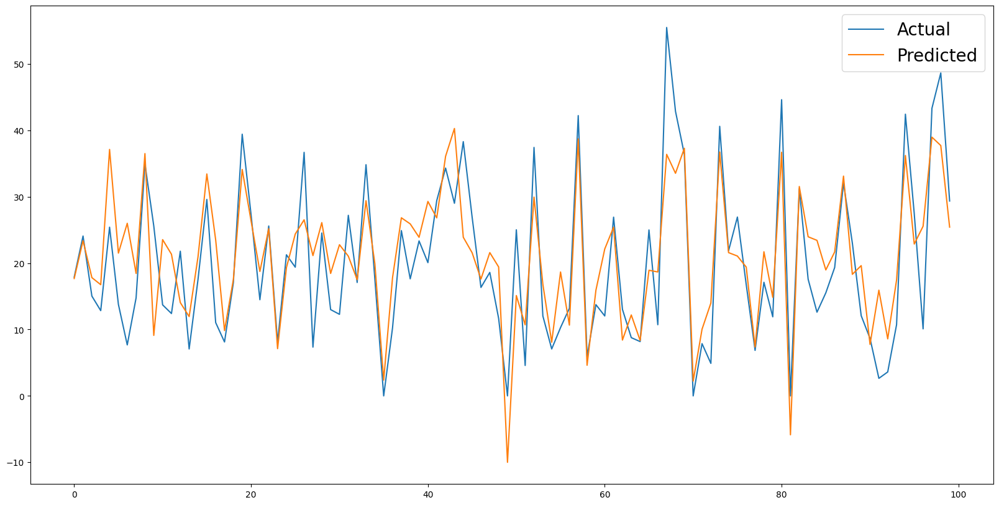


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 56.43457476119059
Root Mean Squared Error (RMSE): 7.512294906431096
R2 Score: 0.6335195402643632
Adjusted R2 Score: 0.6325686599506413

================Evaluation Graph for train==========================



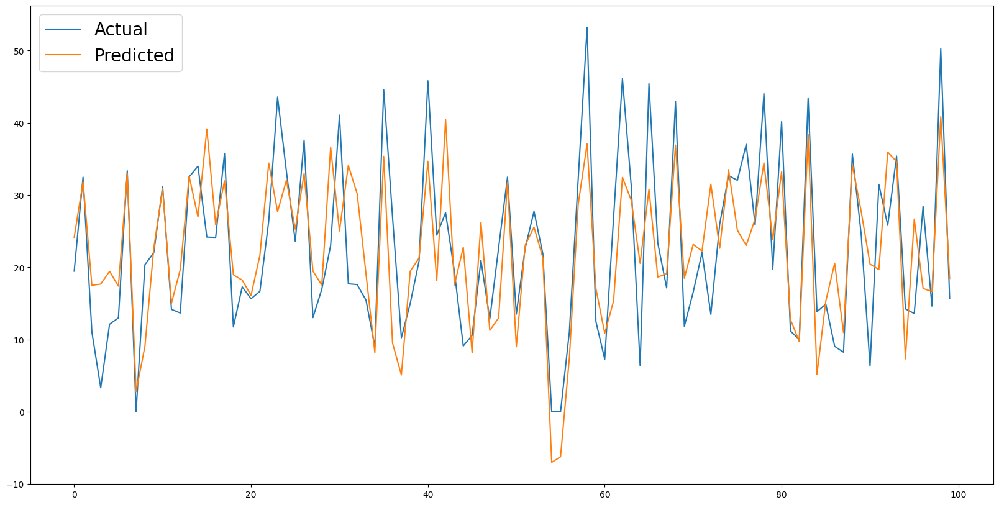


================Evaluation Graph for Residuals vs. Predicted Values==========================



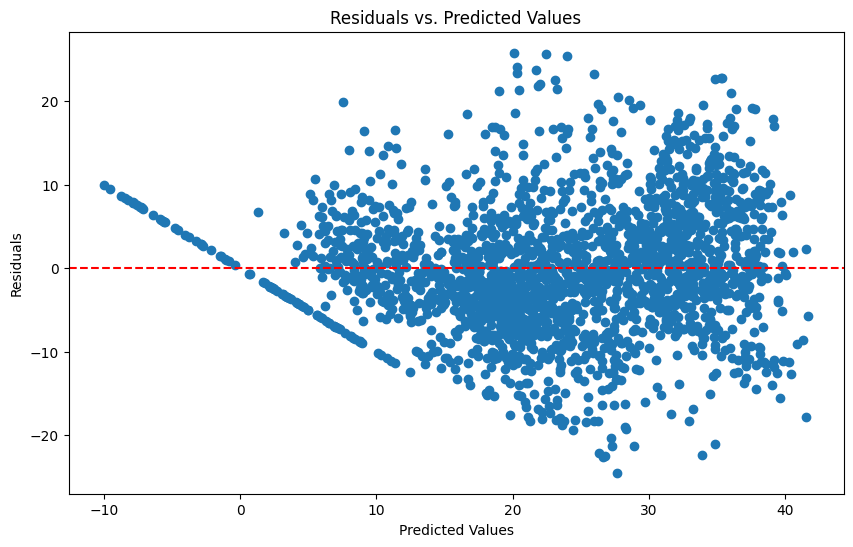

In [ ]:
# Initializing model

ElasticNet_R = ElasticNet(alpha=0.1, l1_ratio=0.5)

linear_model(ElasticNet_R, X_train, y_train, X_test, y_test)


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 55.92783852172123
Root Mean Squared Error (RMSE): 7.478491727729678
R2 Score: 0.6459510545444306
Adjusted R2 Score: 0.6431799532218041

================Evaluation Graph for test==========================



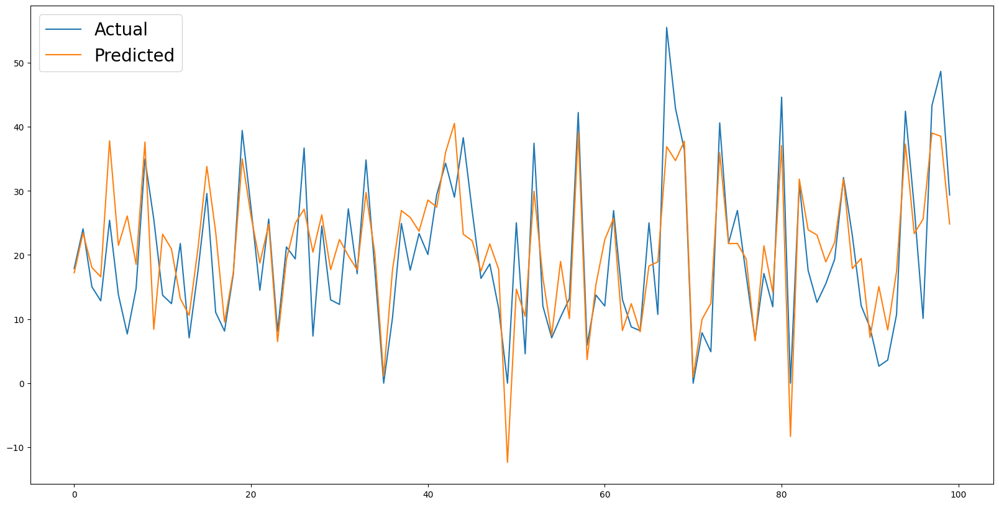


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 55.72980336715343
Root Mean Squared Error (RMSE): 7.465239672452147
R2 Score: 0.6380962549040716
Adjusted R2 Score: 0.6371572494604467

================Evaluation Graph for train==========================



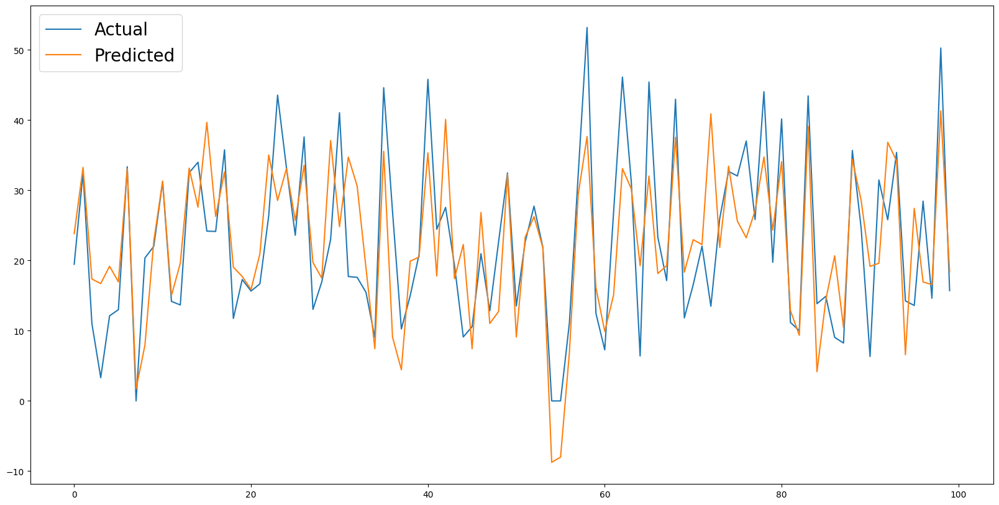


================Evaluation Graph for Residuals vs. Predicted Values==========================



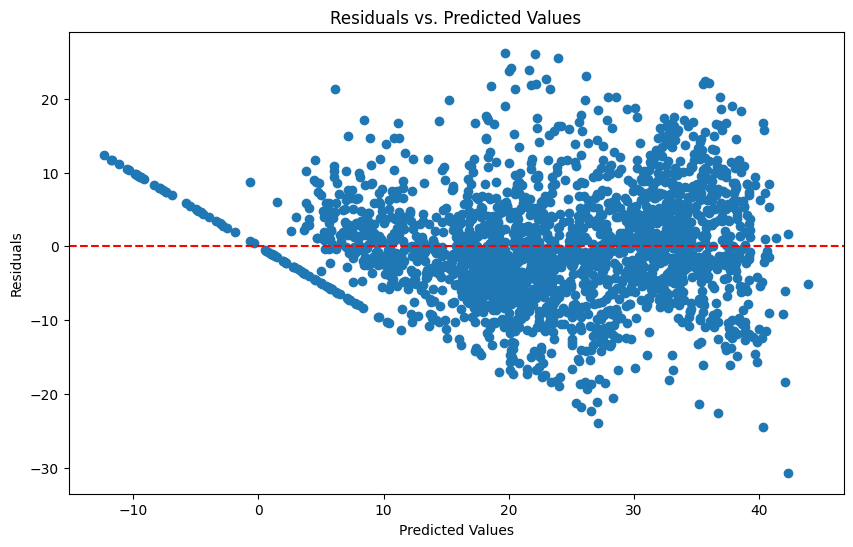

In [ ]:
# finding the best parameters for ridge model by gridsearchcv
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.1,0.2,0.3,0.4,0.5]}
Elastic_grid = GridSearchCV(ElasticNet_R, parameters, scoring='neg_mean_squared_error',cv=5)

linear_model(Elastic_grid, X_train, y_train, X_test, y_test)

# Decision Tree Regression


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 23.537678268293874
Root Mean Squared Error (RMSE): 4.851564517585422
R2 Score: 0.850995668889915
Adjusted R2 Score: 0.8498294287292927

================Evaluation Graph for test==========================



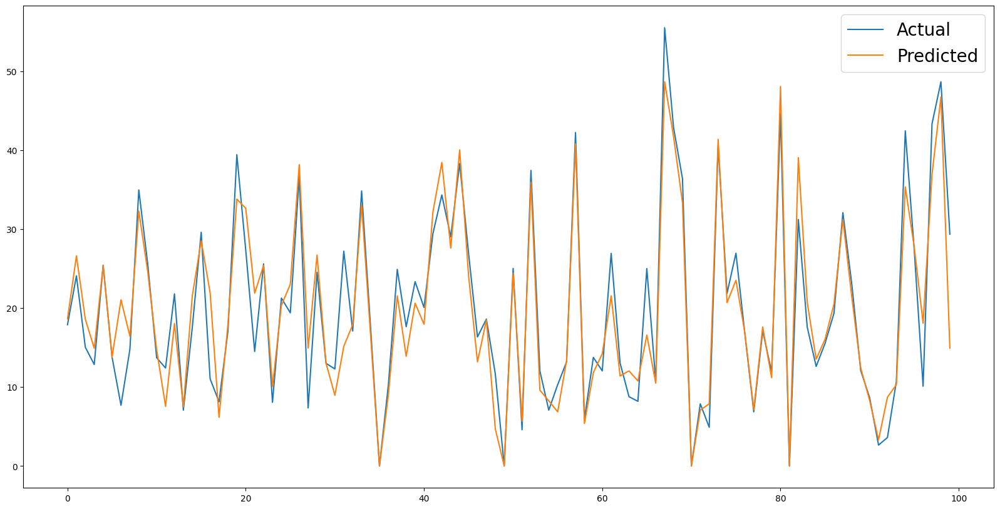


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 3.602104590050282e-34
Root Mean Squared Error (RMSE): 1.897921123242555e-17
R2 Score: 1.0
Adjusted R2 Score: 1.0

================Evaluation Graph for train==========================



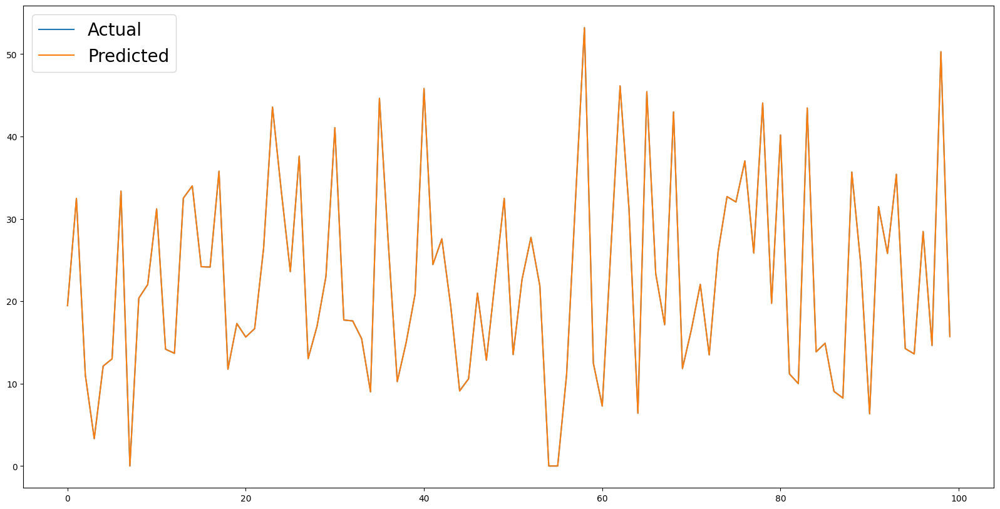


================Evaluation Graph for Residuals vs. Predicted Values==========================



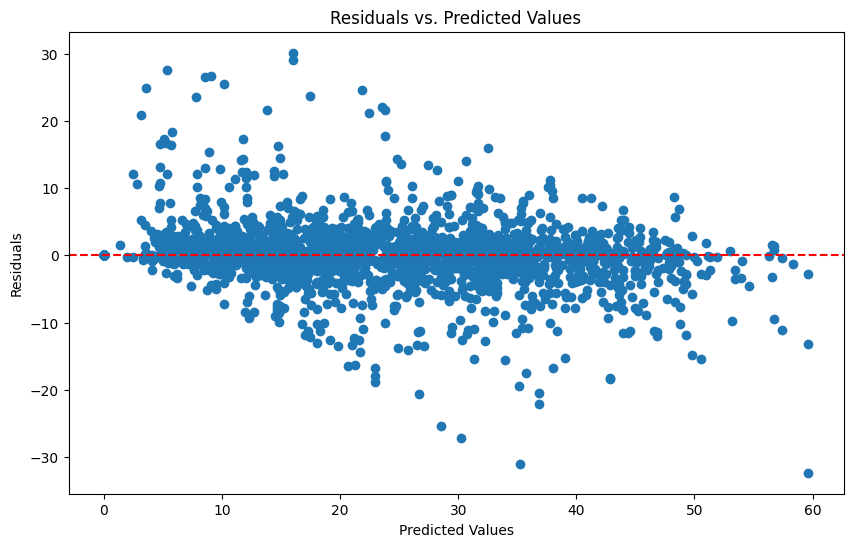

In [ ]:
#Initilazing the model
Dt_R = DecisionTreeRegressor()

linear_model(Dt_R, X_train, y_train, X_test, y_test)


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 18.408013398030654
Root Mean Squared Error (RMSE): 4.290456082752818
R2 Score: 0.8834688072385715
Adjusted R2 Score: 0.8825567306838089

================Evaluation Graph for test==========================



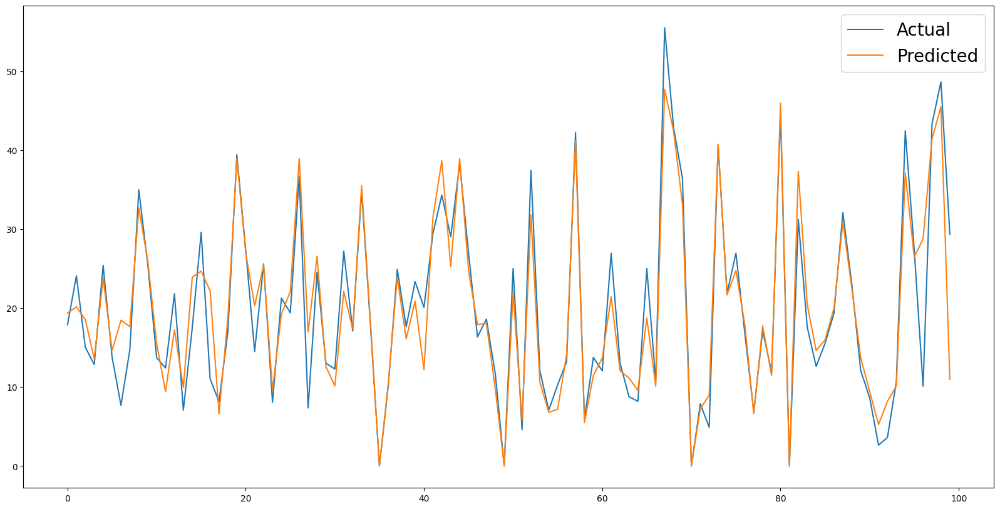


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 5.30024740592492
Root Mean Squared Error (RMSE): 2.302226619150452
R2 Score: 0.9655807257473699
Adjusted R2 Score: 0.9654914205486069

================Evaluation Graph for train==========================



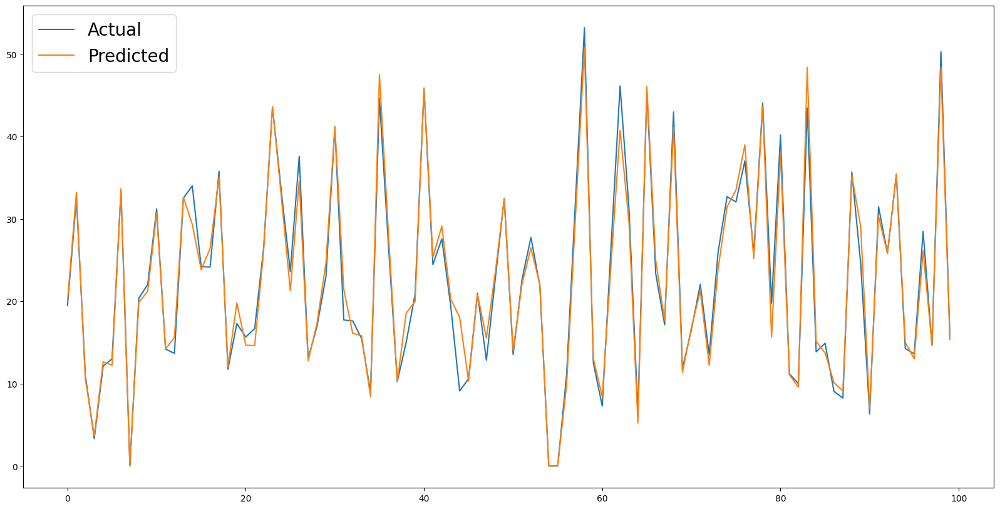


================Evaluation Graph for Residuals vs. Predicted Values==========================



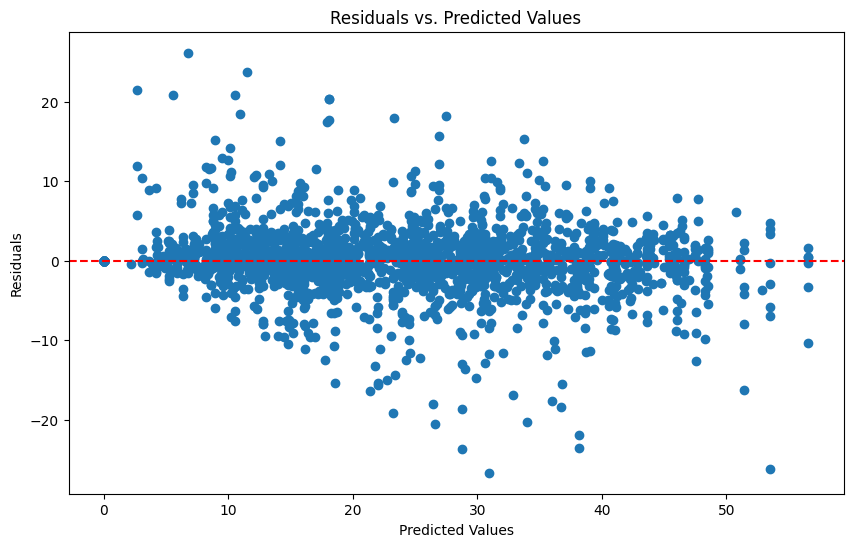

In [ ]:
# Define the hyperparameters and their possible values to tune
parameter = {'max_depth': [None, 5, 10, 15],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],}
DT_grid = GridSearchCV(Dt_R, parameter, cv=5)
linear_model(DT_grid, X_train, y_train, X_test, y_test)


# Random Forest Regression


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 12.138701146648541
Root Mean Squared Error (RMSE): 3.4840638838357343
R2 Score: 0.9231564377639574
Adjusted R2 Score: 0.9225549918348539

================Evaluation Graph for test==========================



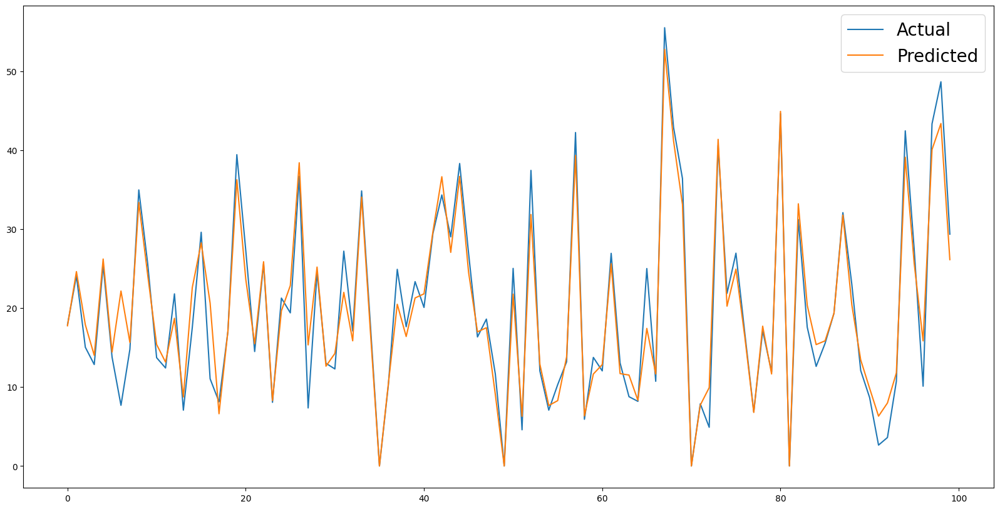


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 1.6979152263910364
Root Mean Squared Error (RMSE): 1.3030407615999726
R2 Score: 0.9889739090727083
Adjusted R2 Score: 0.9889453004729275

================Evaluation Graph for train==========================



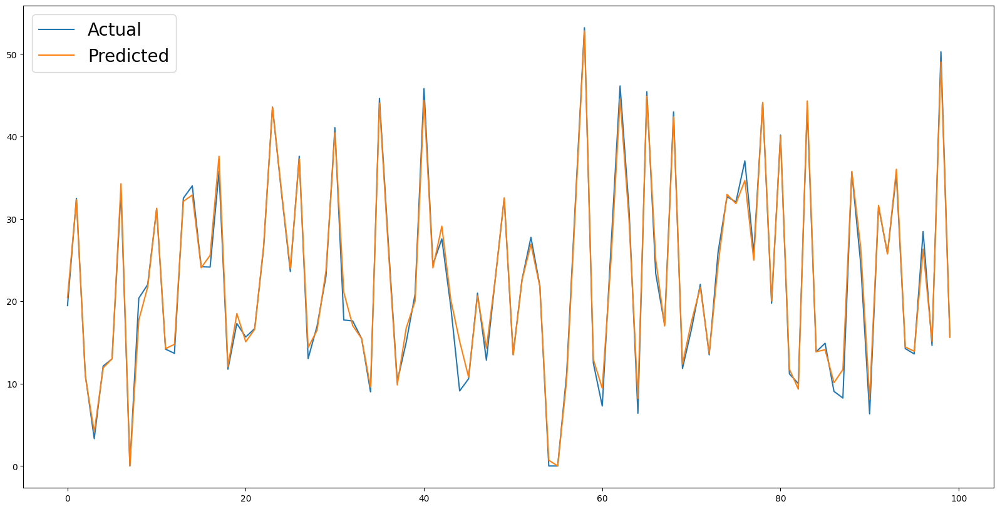


================Evaluation Graph for Residuals vs. Predicted Values==========================



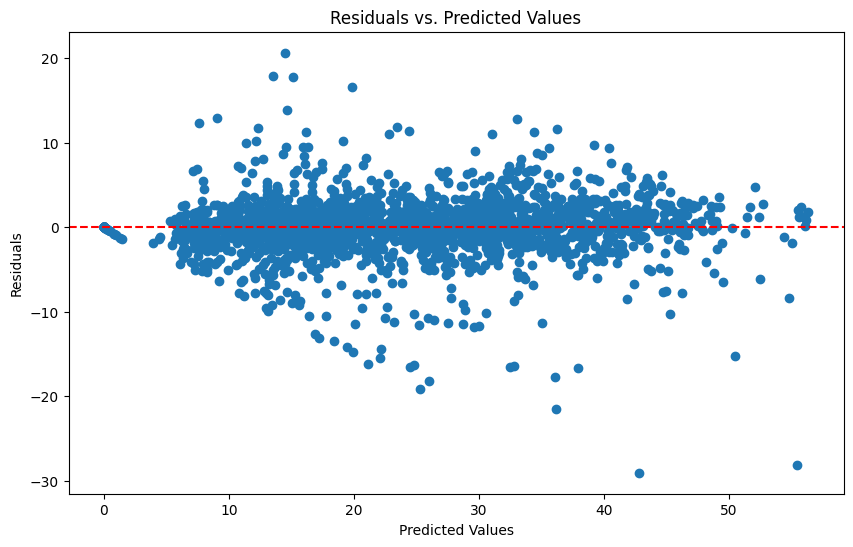

In [ ]:
# Initalizing the Model
Rf_R = RandomForestRegressor()

linear_model(Rf_R, X_train, y_train, X_test, y_test)


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 25.431840925168952
Root Mean Squared Error (RMSE): 5.042999199401974
R2 Score: 0.8390047479297301
Adjusted R2 Score: 0.8377446561777989

================Evaluation Graph for test==========================



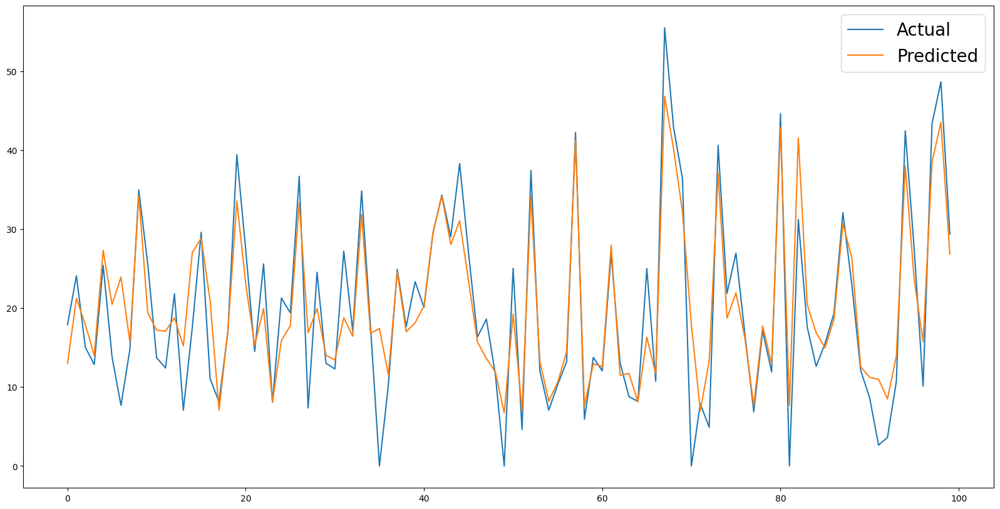


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 21.41726979084743
Root Mean Squared Error (RMSE): 4.627879621473254
R2 Score: 0.8609184013090215
Adjusted R2 Score: 0.860557536355153

================Evaluation Graph for train==========================



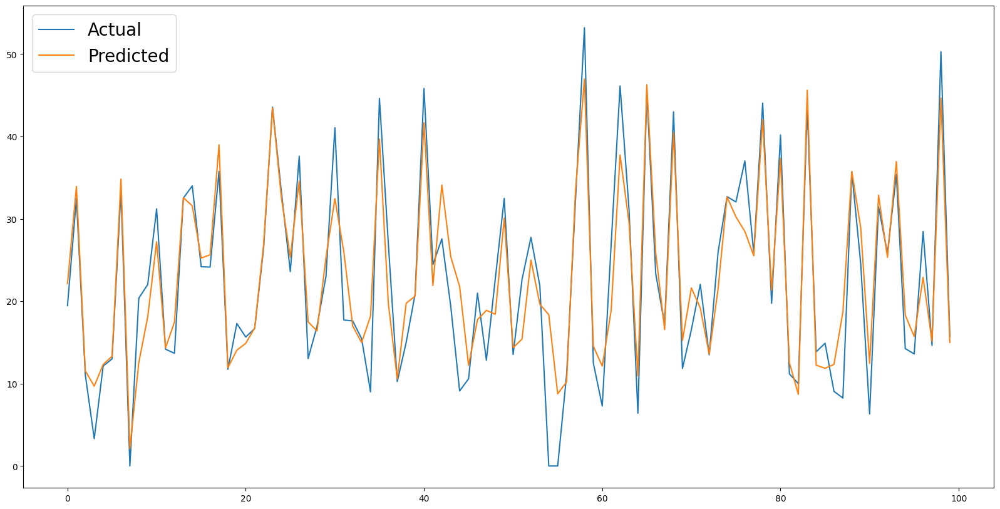


================Evaluation Graph for Residuals vs. Predicted Values==========================



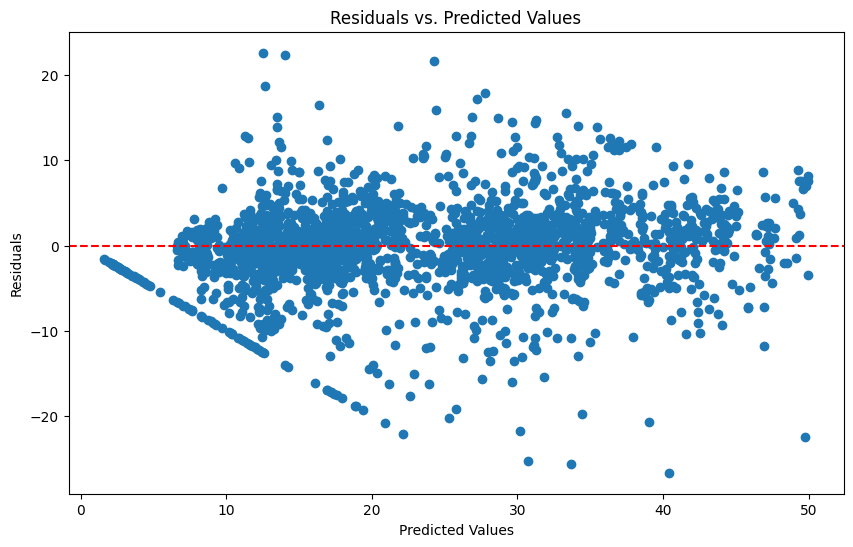

In [ ]:
# Define the hyperparameters and their possible values to tune
parameter = {'n_estimators': [60,80,100],
              'max_depth': [15,20],
              'min_samples_leaf': [40,60,80],}
RF_grid = GridSearchCV(Rf_R, parameter, cv=5)
linear_model(RF_grid, X_train, y_train, X_test, y_test)
            


# Gradient Boosting


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 19.843871932384204
Root Mean Squared Error (RMSE): 4.4546461063011735
R2 Score: 0.8743791622004601
Adjusted R2 Score: 0.8733959420151045

================Evaluation Graph for test==========================



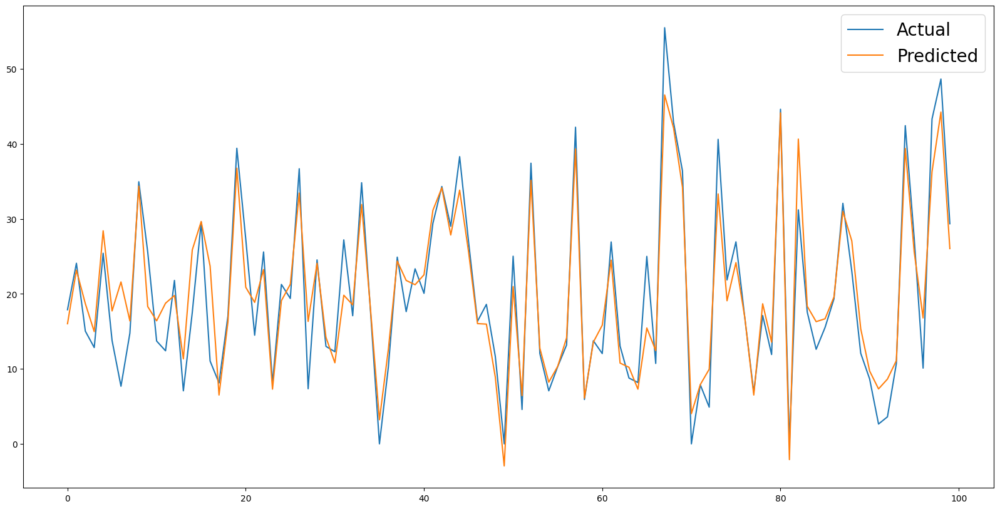


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 17.414218555728674
Root Mean Squared Error (RMSE): 4.173034693808413
R2 Score: 0.8869138139297346
Adjusted R2 Score: 0.8866203973907855

================Evaluation Graph for train==========================



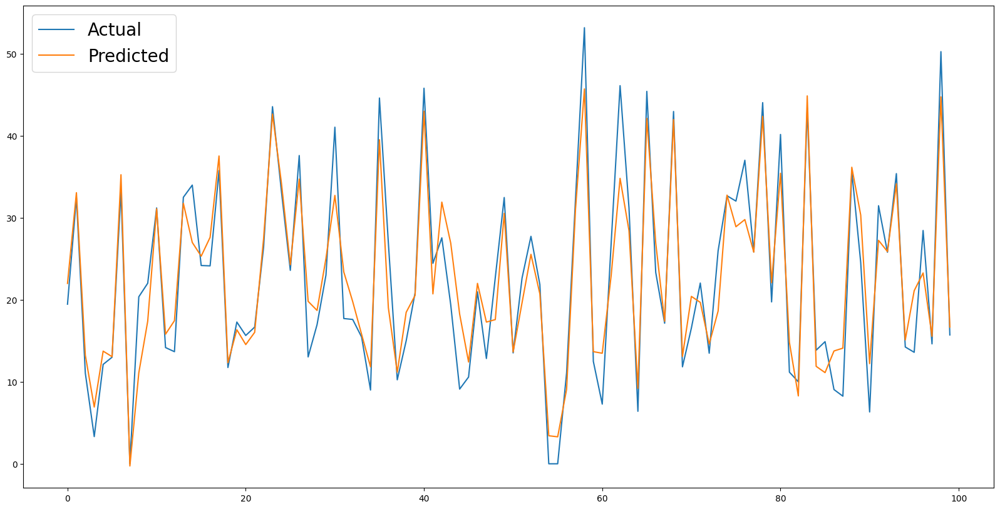


================Evaluation Graph for Residuals vs. Predicted Values==========================



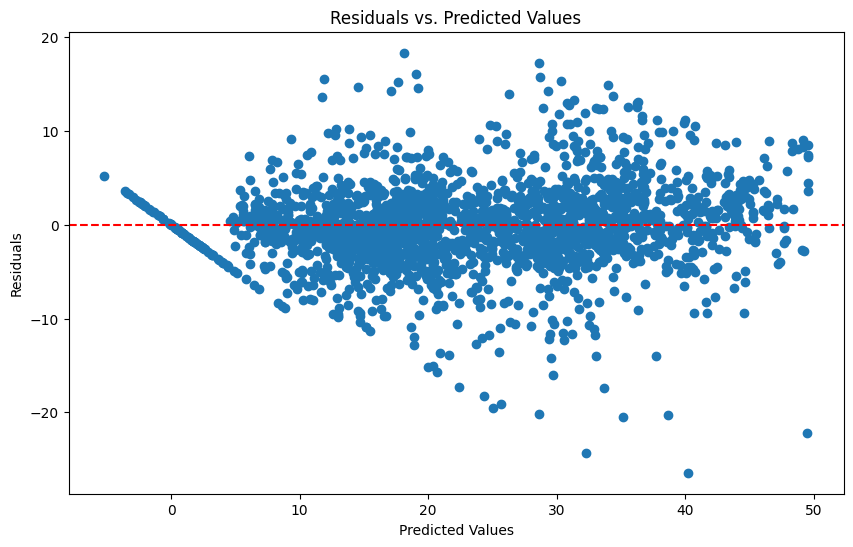

In [ ]:
#creating model of Gradient Boosting
GB_R=GradientBoostingRegressor()

linear_model(GB_R, X_train, y_train, X_test, y_test)


================Evaluation Metrics for test=========================

Mean Squared Error (MSE): 16.770069278396814
Root Mean Squared Error (RMSE): 4.095127504534727
R2 Score: 0.8938377469937935
Adjusted R2 Score: 0.8930068269656601

================Evaluation Graph for test==========================



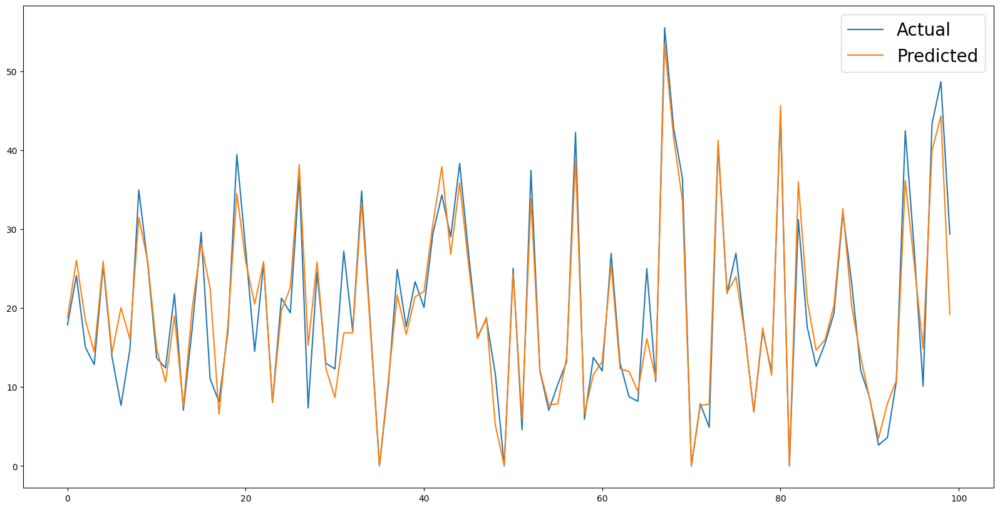


================Evaluation Metrics for train=========================

Mean Squared Error (MSE): 0.00029297040902405706
Root Mean Squared Error (RMSE): 0.017116378385162473
R2 Score: 0.9999980974795922
Adjusted R2 Score: 0.9999980925432603

================Evaluation Graph for train==========================



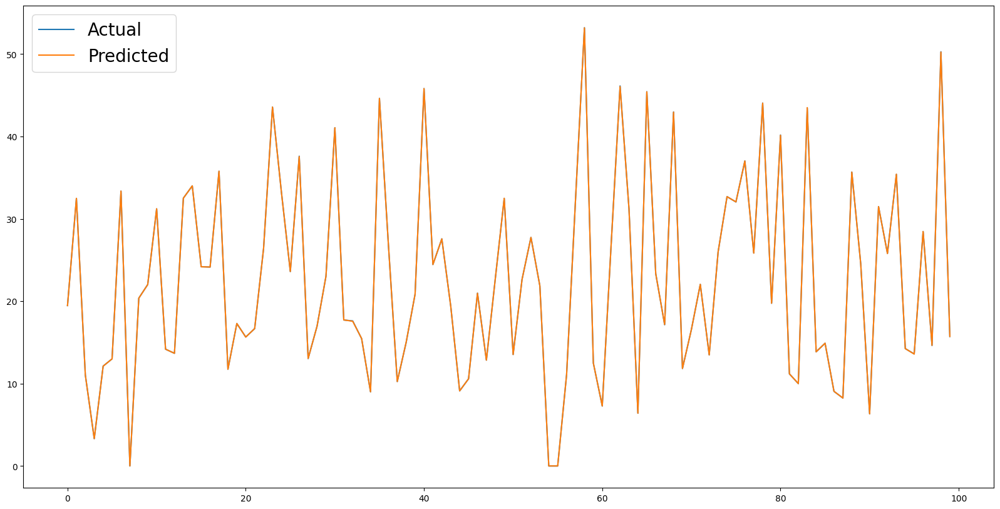


================Evaluation Graph for Residuals vs. Predicted Values==========================



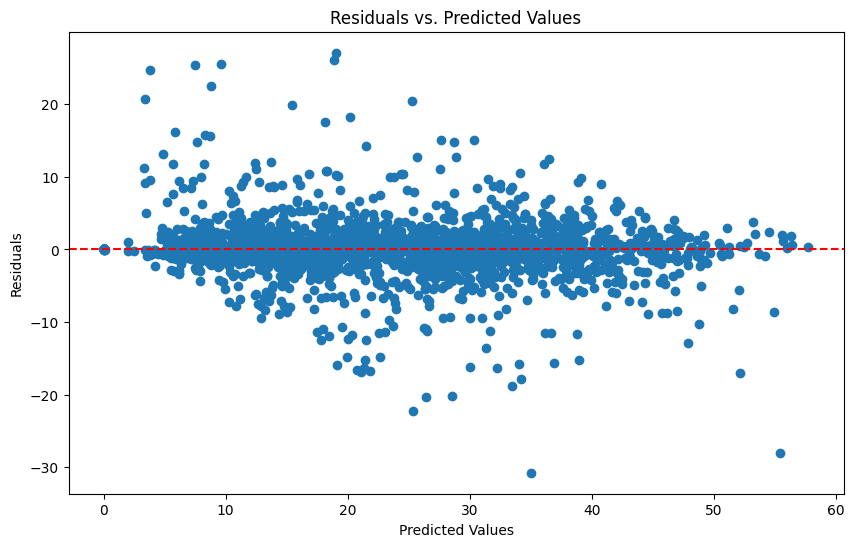

In [ ]:
# creating param dict to check diffirent value of parameter
n_estimators=[80,100,150]
max_depth=[15,20,30]

parameter = {'n_estimators':n_estimators,'max_depth':max_depth }

#grid search for gradient bossting
GB_grid= GridSearchCV(GB_R,param_grid=parameter,verbose=0)

linear_model(GB_grid, X_train, y_train, X_test, y_test)

# Evaluation Matrix of All the  models

In [ ]:
#creating dictionary to store all the metrices 
all_model_matrices={'Mean_square_error':mean_sq_error,'Root_Mean_square_error':root_mean_sq_error,'R2':r2_sq_list,'Adjusted_R2':adj_r2_sq_list}

In [ ]:
#list of all model 
model_name=['Linear_test','Linear_train','Ridge_test','Ridge_train','Ridge_HP_test','Ridge_HP_train','Lasso_test','Lasso_train','Lasso_HP_test','Lasso_HP_train','Elasticnet_test','Elasticnet_train','Elastic_HP_test','Elastic_HP_train','Decision_Tree_test','Decision_Tree_train','DT_HP_test','DT_HP_train','Random_Forest_test','Random_Forest_train','RF_HP_test','RF_HP_train','Gradient_Boosting_test','Gradient_Boosting_train','GB_HP_test','GB_HP_train']

In [ ]:
#converting dict to dataframe 
all_matrices =pd.DataFrame.from_dict(all_model_matrices,orient="index",columns=model_name)
# Rounding all numbers in the dataframe to 4 decimal places
all_matrices = all_matrices.round(4)

In [ ]:
#transposing all_matrices for easy understanding
all_matrices_1=all_matrices.transpose().reset_index().rename(columns={'index':'Models'})
all_matrices_1

,Models,Mean_square_error,Root_Mean_square_error,R2,Adjusted_R2
0,Linear_test,55.9470,7.4798,0.6458,0.6431
1,Linear_train,55.7193,7.4645,0.6382,0.6372
2,Ridge_test,55.9464,7.4797,0.6458,0.6431
3,Ridge_train,55.7193,7.4645,0.6382,0.6372
4,Ridge_HP_test,55.9286,7.4785,0.6459,0.6432
5,Ridge_HP_train,55.7282,7.4651,0.6381,0.6372
6,Lasso_test,63.7367,7.9835,0.5965,0.5934
7,Lasso_train,62.9910,7.9367,0.5909,0.5899
8,Lasso_HP_test,55.9388,7.4792,0.6459,0.6431
9,Lasso_HP_train,55.7205,7.4646,0.6382,0.6372


In [ ]:
# Filter rows in all_matrices_1 dataframe where Models column contains "test"
test_df = all_matrices_1[all_matrices_1['Models'].str.contains('test')]

# Printing the filtered dataframe
test_df

,Models,Mean_square_error,Root_Mean_square_error,R2,Adjusted_R2
0,Linear_test,55.9470,7.4798,0.6458,0.6431
2,Ridge_test,55.9464,7.4797,0.6458,0.6431
4,Ridge_HP_test,55.9286,7.4785,0.6459,0.6432
6,Lasso_test,63.7367,7.9835,0.5965,0.5934
8,Lasso_HP_test,55.9388,7.4792,0.6459,0.6431
10,Elasticnet_test,56.5423,7.5195,0.6421,0.6393
12,Elastic_HP_test,55.9278,7.4785,0.6460,0.6432
14,Decision_Tree_test,23.5377,4.8516,0.8510,0.8498
16,DT_HP_test,18.4080,4.2905,0.8835,0.8826
18,Random_Forest_test,12.1387,3.4841,0.9232,0.9226


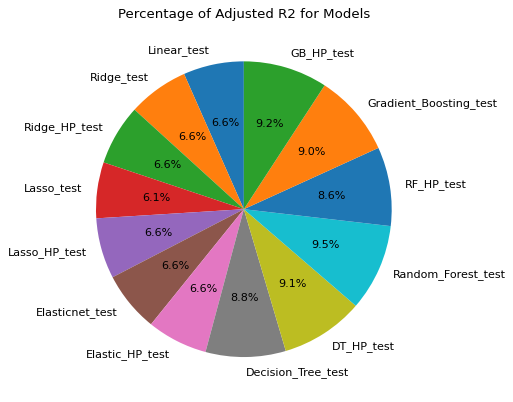

In [ ]:
# Calculate the percentage of Adjusted R2 for each model
test_df['Adjusted_R2_Percentage'] = test_df['Adjusted_R2'] * 100 / test_df['Adjusted_R2'].sum()

# Create pie plot using the calculated percentages
plt.figure(figsize=(8, 6), dpi=80)
plt.pie(test_df['Adjusted_R2_Percentage'], labels=test_df['Models'], autopct='%1.1f%%', startangle=90)
plt.title('Percentage of Adjusted R2 for Models')
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?



*  Mean Squared Error (MSE) :Lower MSE values indicate better accuracy in    predicting demand, which can positively impact the business by providing more accurate forecasts for bike demand.

*   Root Mean Squared Error (RMSE) : lower RMSE values indicate better accuracy and can positively impact the business by providing more accurate forecasts for bike demand.
*   R2 Score : R2 values closer to 1 indicate a better fit of the model to the data, which can positively impact the business by indicating a higher level of accuracy in predicting bike demand.

*   Adjusted R2 Score :  Higher adjusted R2 values indicate better model performance, which can positively impact the business by indicating a higher level of accuracy in predicting bike demand while accounting for the complexity of the model.









### 2. Which ML model did you choose from the above created models as your final prediction model and why?



*   Overall, based on these Random Forest test metrics, the evaluation metrics considered for a positive business impact are MSE, RMSE, R2, and Adjusted R2, indicating better accuracy, precision, and model fit, which can lead to improved decision making and performance for a business.




### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
# Extract feature importances
feature_importances = Rf_R.feature_importances_

# Create a dataframe to store the feature importances
feature_importance_df = pd.DataFrame({'Features': X_train.columns, 'Importance': feature_importances})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Reset the index to start from 0
feature_importance_df = feature_importance_df.reset_index(drop=True)

# Print the feature importances
print(feature_importance_df)

                     Features  Importance
0             Temperature(°C)    0.276164
1                        Hour    0.257503
2                 Humidity(%)    0.151741
3             Functioning Day    0.151272
4                      Winter    0.039549
5                        week    0.020880
6   Dew point temperature(°C)    0.020773
7     Solar Radiation (MJ/m2)    0.019472
8                       month    0.017237
9            Visibility (10m)    0.013124
10           Wind speed (m/s)    0.012272
11                     Autumn    0.011666
12                    Holiday    0.005136
13                     Spring    0.002221
14                     Summer    0.000990
15               Rainfall(mm)    0.000000
16              Snowfall (cm)    0.000000




*   The model used in this case is a Random Forest Regression model,The Random Forest model is trained on a dataset that includes various features such as temperature, hour, humidity, functioning day, season, month, etc., to predict the demand for bike sharing.
*   Based on the feature importance results, we can see that the most important features in predicting bike sharing demand are "Temperature(°C)", "Hour", "Humidity(%)", and "Functioning Day", as they have relatively higher importance scores compared to other features.

*   Other features such as season, month, visibility, and wind speed also contribute to the predictions, although to a lesser extent. 
*   Features such as rainfall, snowfall, and holiday have very low or zero importance scores, indicating that they may have minimal impact on the model's predictions.





# **Conclusion**

Looking at the performance metrics of all the models, we can make the following observations:

* Linear regression, Ridge regression, and Lasso regression have similar performance on the test set, with a relatively high RMSE of around 7.5 and R2 score of around 0.64. However, the adjusted R2 score is slightly lower, which indicates that the models may be overfitting to some extent.

* The decision tree model has a significantly lower RMSE of around 4.8 on the test set, with a high R2 score of 0.85 and an adjusted R2 score of 0.85. However, the model seems to be overfitting as the RMSE is 0 on the training set.

* The random forest and gradient boosting models also have good performance on the test set with RMSE values of around 3.4 and 4.5, respectively. They also have high R2 scores of around 0.92 and 0.87 and adjusted R2 scores of around 0.92 and 0.87, respectively. However, the performance of these models is lower on the training set compared to the decision tree model.

* The hyperparameter tuning did not improve the performance of Ridge and Lasso regression models significantly.

In conclusion, the decision tree, random forest, and gradient boosting HP model seem to perform the best on the test set, with random forest having the lowest RMSE. However, the decision tree model is likely overfitting to the training set. Therefore, the random forest and gradient boosting models may be better choices for this regression problem.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***